**Table of contents**<a id='toc0_'></a>    
- [A) DATA COLLECTION + EDA](#toc1_)    
  - [Step 01: Load the dataset](#toc1_1_)    
  - [Step 02: Exploratory Data Analysis (EDA) + Time Series Visualization](#toc1_2_)    
    - [Data Analysis & Preparation: Check Data Quality](#toc1_2_1_)    
    - [Test for Stationarity](#toc1_2_2_)    
    - [Analyze Seasonality & Trends](#toc1_2_3_)    
- [B) Baseline: Prophet](#toc2_)    
  - [Data Preparation for Prophet](#toc2_1_)    
  - [Initialize and train the Prophet model](#toc2_2_)    
  - [Tests of parameters optimization of Prophet Model](#toc2_3_)    
  - [Feature Engineering](#toc2_4_)    
  - [Alternative Models: ARIMA, LSTM, etc...](#toc2_5_)    
    - [ARIMA (AutoRegressive Integrated Moving Average)](#toc2_5_1_)    
  - [Cross-Validation Model Evaluation using Prophet](#toc2_6_)    
- [C) XGBOOST MODEL](#toc3_)    
  - [Data preparation for XGBoost](#toc3_1_)    
  - [Feature Creation](#toc3_2_)    
  - [Train / Test Split for XGBoost](#toc3_3_)    
- [D) Hyperparameter Tuning & Optimization](#toc4_)    
  - [Data preparation for hyperparameter tuning of Prophet models](#toc4_1_)    
  - [Hyperparameters and estimator class that wraps around Prophet models](#toc4_2_)    
  - [GridSearchCV of scikit-learn with Prophet estimator](#toc4_3_)    
  - [RandomizedSearchCV of scikit-learn with Prophet estimator](#toc4_4_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[A) DATA COLLECTION + EDA](#toc0_)

In [1]:
# ============================
# IMPORT LIBRAIRIES
# ============================

# librairie pour manipuler data et faire des calculs
import pandas as pd
import numpy as np

# gestion dossiers et fichiers
import os
from pathlib import Path
import shutil
from pprint import pprint
import sys
# Import datetime locally to validate date values after regex extraction.
from datetime import datetime
import time  # Import time to measure the duration of the training process
from typing import Any, cast

# librairies pour se connecter à AWS S3 et manipuler les données dans le bucket
import boto3
# librairie HTTP pour appeler l’API
import requests

# librairie de prévision de séries temporelles
# Import Prophet and its diagnostics tools for time series forecasting and model evaluation, allowing us to build a forecasting model for the water height variable and assess its performance using cross-validation techniques.
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

# librairies de machine learning
# Import train_test_split and TimeSeriesSplit for splitting the data, and various metrics for evaluating the model"s performance
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.metrics import (r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error)

# librairie de prétraitement des données
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Librairie les modèles de machine learning ensemblistes
import xgboost as xgb
from xgboost import XGBClassifier, XGBRegressor

# Import joblib and pickle for model serialization
import pickle
import joblib

# Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
# Import plotly for interactive visualizations
from plotly import express as px
from plotly import graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot

# init_notebook_mode(connected=True)

# Import dotenv to load environment variables from .env file
# Import the load_dotenv function to read key-value pairs from a .env file into the OS environment
from dotenv import load_dotenv

In [2]:
# ============================
# CONFIGURATION
# ============================

# In notebooks, __file__ is usually undefined. Fall back to CWD.
try:
    CURRENT_DIR = Path(__file__).resolve().parent
except NameError:
    CURRENT_DIR = Path.cwd().resolve()

# If the notebook is launched from repo root, locate the data_collection folder.
if not (CURRENT_DIR / "utils.py").exists():
    candidate_dir = CURRENT_DIR / "Dev" / "python_apps" / "data_collection"
    if candidate_dir.exists():
        CURRENT_DIR = candidate_dir

# Add folder to import search path once
if str(CURRENT_DIR) not in sys.path:
    sys.path.insert(0, str(CURRENT_DIR))

from utils import parse_s3_uri

# URL base API HubEau hydrométrie
API_BASE_URL = "https://hubeau.eaufrance.fr/api/v2/hydrometrie"


# *==========================================================================================
# *1. CONFIGURATION : aws s3
# *==========================================================================================

# ************* ATTENTION : INTERDIRE D'AFFICHER/IMPRIMER LES CREDENTIELS d'AWS S3*************
# 1. get IAM AWS credentials from env variables if they exist, otherwise use the default ones (user_access_key and user_secret_key)
load_dotenv(dotenv_path=CURRENT_DIR / ".env")  # load env variables from .env file in data_collection
# load_dotenv()  # load env variables from .env file in the current directory
AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")
AWS_S3_PROFILE_NAME = os.getenv("AWS_S3_PROFILE_NAME", "default")
AWS_DEFAULT_REGION = os.getenv("AWS_DEFAULT_REGION", "eu-west-3")
EXISTING_BUCKET_MAIN = os.getenv("EXISTING_BUCKET_MAIN")
S3_RESOURCE_ROOT_FOLDER = os.getenv("S3_RESOURCE_ROOT_FOLDER")
# ************* ATTENTION : INTERDIRE D'AFFICHER/IMPRIMER LES CREDENTIELS *************

In [3]:
# ============================
# Scrapping and uploading data to AWS S3
# ============================

# %python .\upload_to_s3.py

In [4]:
# ============================
# get or download data from AWS S3
# ============================

# %python .\download_from_s3_URI.py

Accessing s3 bucket resource

In [5]:
# Specific folder in your s3 bucket where to store the data inside the root folder, you can change it as you want
# if the root folder <Final_Project_Forecasting> does not exist in your s3 bucket, it will be created automatically when you upload the first file to it, 
# same for the subfolder <Dataset/hubeau_api> 
S3_RESOURCE_DATA_FOLDER = f"{S3_RESOURCE_ROOT_FOLDER}/Dataset/hubeau_api"

# choose the storage folder in your s3 bucket where to upload the json and csv files
S3_STORAGE_ALL = f"{S3_RESOURCE_DATA_FOLDER}/ALL"
S3_STORAGE_VARS = f"{S3_RESOURCE_DATA_FOLDER}/VARS"

# 2. Create an instance of `boto3.Session` that connects with your aws account.
# Create a low-level service client by name using the default session.
# A session stores configuration state and allows you to create service clients and resources
aws_session = boto3.Session(
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY,
    region_name=AWS_DEFAULT_REGION,
    profile_name=AWS_S3_PROFILE_NAME
)

# 3. Create a variable called `s3` that connects your session to the s3 ressource.
# Create a resource service client by name: create an S3 resource using the aws session
# The resource provides an object-oriented API as well as low-level access to AWS services. See the documentation for details on the service's resource APIs.
# service_name : string. The name of a service, e.g. 's3' or 'ec2'. You can get a list of available services via get_available_resources.
s3_resource = aws_session.resource("s3")

print("S3 resource service created successfully:", s3_resource)
# Tester la connexion en listant les buckets de votre compte S3 resource
print("\nBuckets in your S3 resource:", s3_resource.buckets.all())
# List all buckets in your S3 ressources service
print("\nBuckets in your S3 resource:")
for bucket in s3_resource.buckets.all():
    print(f" - ressource - Bucket: {bucket.name}")

# 4. Create a variable will connect to an existing bucket in your s3 or to a bucket you are creating now.
# Create a bucket resource object for the existing bucket using the s3 resource
S3_BUCKET_RESOURCE = s3_resource.Bucket(EXISTING_BUCKET_MAIN)

print(f"\nCalling the bucket object: {S3_BUCKET_RESOURCE}")
print(f"Using Bucket Name: {S3_BUCKET_RESOURCE.name}")
print(f"Bucket Creation Date: {S3_BUCKET_RESOURCE.creation_date}")
# print(f"Bucket ACL: {S3_BUCKET_RESOURCE.Acl()}")

S3 resource service created successfully: s3.ServiceResource()

Buckets in your S3 resource: s3.bucketsCollection(s3.ServiceResource(), s3.Bucket)

Buckets in your S3 resource:
 - ressource - Bucket: jedha-dz-dsft41
 - ressource - Bucket: mlflow-bucket-41-dz

Calling the bucket object: s3.Bucket(name='jedha-dz-dsft41')
Using Bucket Name: jedha-dz-dsft41
Bucket Creation Date: 2026-05-18 12:30:31+00:00


Getting the s3 URI link of data files from the bucket and creating a database in pandas DataFrame for each type of data (ALL and VARS)

In [6]:
## Recupération des URI des fichiers stockés dans AWS S3 pour une utilisation ultérieure dans le projet
s3_ALL_DATABASE_dict = {"site_name":[], "code_site":[], "code_station":[], "s3_csv_uri":[], "s3_json_uri":[], "start_date":[], "end_date":[]}
s3_VAR_DATABASE_dict = {"site_name":[], "code_site":[], "code_station":[], "measure":[], "s3_csv_uri":[], "s3_json_uri":[], "start_date":[], "end_date":[]}

"""
main path format types to respect for the files stored in the S3 bucket, which are defined in the upload_to_s3.py script when we upload the files to S3:
- hubeau_obs_elab_{site_name}_{code_site}_{code_station}_ALL_{start_date}_{end_date}
- hubeau_obs_elab_{site_name}_{code_site}_{code_station}_{grandeur_hydro_elab}_{start_date}_{end_date}

- Grandeurs hydrométriques (grandeur_hydro_elab) élaborées disponibles : 
    - débits moyens journaliers (QmnJ), 
    - débits moyens mensuels (QmM), 
    - Hauteur instantanée maximale mensuelle (HIXM), 
    - Hauteur instantanée maximale journalière (HIXnJ), 
    - Débit instantané minimal mensuel (QINM), 
    - Débit instantané minimal journalier (QINnJ), 
    - Débit instantané maximal mensuel (QixM), 
    - Débit instantané maximal journalier (QIXnJ)
"""

print(f"\nObjects in the bucket {S3_BUCKET_RESOURCE.name}:")
for obj in S3_BUCKET_RESOURCE.objects.all():
    # Final_Project_Forecasting/Dataset/hubeau_api
    if obj.key.startswith(f"{S3_RESOURCE_DATA_FOLDER}/ALL/cleaned"):
        s3_uri = f"s3://{S3_BUCKET_RESOURCE.name}/{obj.key}"
        site_name, code_site, code_station, measure, start_date, end_date = parse_s3_uri(s3_uri)
        # print("ALL:", site_name, code_site, code_station, measure, start_date, end_date)
        s3_ALL_DATABASE_dict["s3_csv_uri"].append(s3_uri)
        s3_ALL_DATABASE_dict["s3_json_uri"].append(s3_uri)
        s3_ALL_DATABASE_dict["site_name"].append(site_name)
        s3_ALL_DATABASE_dict["code_site"].append(code_site)
        s3_ALL_DATABASE_dict["code_station"].append(code_station)
        s3_ALL_DATABASE_dict["start_date"].append(start_date)
        s3_ALL_DATABASE_dict["end_date"].append(end_date)
    elif obj.key.startswith(f"{S3_RESOURCE_DATA_FOLDER}/VARS/cleaned"):
        s3_uri = f"s3://{S3_BUCKET_RESOURCE.name}/{obj.key}"
        site_name, code_site, code_station, measure, start_date, end_date = parse_s3_uri(s3_uri)
        # print("VARS:", site_name, code_site, code_station, measure, start_date, end_date)
        s3_VAR_DATABASE_dict["s3_csv_uri"].append(s3_uri)
        s3_VAR_DATABASE_dict["s3_json_uri"].append(s3_uri)
        s3_VAR_DATABASE_dict["site_name"].append(site_name)
        s3_VAR_DATABASE_dict["code_site"].append(code_site)
        s3_VAR_DATABASE_dict["code_station"].append(code_station)
        s3_VAR_DATABASE_dict["measure"].append(measure)
        s3_VAR_DATABASE_dict["start_date"].append(start_date)
        s3_VAR_DATABASE_dict["end_date"].append(end_date)

# Convert the dictionaries to pandas DataFrames for easier manipulation and analysis
import pandas as pd

s3_ALL_DATABASE_df = pd.DataFrame(s3_ALL_DATABASE_dict)
s3_VAR_DATABASE_df = pd.DataFrame(s3_VAR_DATABASE_dict)
s3_ALL_DATABASE_df.to_csv(CURRENT_DIR / "s3_ALL_DATABASE.csv", index=False)
s3_VAR_DATABASE_df.to_csv(CURRENT_DIR / "s3_VAR_DATABASE.csv", index=False)

print("\nDataFrame for ALL database:")
display(s3_ALL_DATABASE_df)
print("\nDataFrame for VARS database:")
display(s3_VAR_DATABASE_df)


Objects in the bucket jedha-dz-dsft41:

DataFrame for ALL database:


,site_name,code_site,code_station,s3_csv_uri,s3_json_uri,start_date,end_date
0,Colmar-1,A1580201,A158020101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1963-03-01,1988-11-02
1,Colmar-1,A1580201,A158020101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1963-03-01,1988-11-02
2,Colmar-1,A1580201,A158020101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1963-03-01,1988-11-02
3,Colmar-1,A1580201,A158020101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1963-03-01,1988-11-02
4,Colmar-2,A1610030,A161003001,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1958-11-11,2026-05-01
5,Colmar-2,A1610030,A161003001,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1958-11-11,2026-05-01
6,Colmar-2,A1610030,A161003001,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1958-11-11,2026-05-01
7,Colmar-2,A1610030,A161003001,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1958-11-11,2026-05-01
8,Colmar-3,A2220001,A222000101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2019-11-15,2026-06-07
9,Colmar-3,A2220001,A222000101,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2019-11-15,2026-06-07



DataFrame for VARS database:


,site_name,code_site,code_station,measure,s3_csv_uri,s3_json_uri,start_date,end_date
0,Colmar-1,A1580201,A158020101,HIXM,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1971-02-01,1988-10-01
1,Colmar-1,A1580201,A158020101,HIXM,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1971-02-01,1988-10-01
2,Colmar-1,A1580201,A158020101,HIXM,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1971-02-01,1988-10-01
3,Colmar-1,A1580201,A158020101,HIXM,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1971-02-01,1988-10-01
4,Colmar-1,A1580201,A158020101,HIXnJ,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,1971-01-01,1988-11-02
...,...,...,...,...,...,...,...,...
301,Waltenheim,A3480200,A348020001,QmnJ,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2007-01-01,2026-06-07
302,Waltenheim,A3480200,A348020001,QmnJ,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2007-01-01,2026-06-05
303,Waltenheim,A3480200,A348020001,QmnJ,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2007-01-01,2026-06-05
304,Waltenheim,A3480200,A348020001,QmnJ,s3://jedha-dz-dsft41/Final_Project_Forecasting...,s3://jedha-dz-dsft41/Final_Project_Forecasting...,2007-01-01,2026-06-06


## <a id='toc1_1_'></a>[Step 01: Load the dataset](#toc0_)

In [7]:
site_name = "Kogenheim"
code_site = "A2360030"
code_station = "A236003001"
site_measure = "HIXnJ"

# période souhaitée (historique):  
# les formats de date (ISO 8601) supportés : yyyy-MM-dd, yyyy-MM-dd'T'HH:mm:ss, yyyy-MM-dd'T'HH:mm:ssXXX, exemples : 2018-12-01, 2018-12-11T00:00:01, 2018-12-11T00:00:01Z
DATE_DEBUT_OBS, DATE_FIN_OBS = ("2007-01-01", "2026-06-07")

data_URI = f"s3://jedha-dz-dsft41/Final_Project_Forecasting/Dataset/hubeau_api/VARS/cleaned/hubeau_obs_elab_{site_name}_{code_site}_{code_station}_{site_measure}_{DATE_DEBUT_OBS}_{DATE_FIN_OBS}.csv"

dataset_df = pd.read_csv(data_URI)
# .\nowcast-flood-risk\src\dz\data\vars\hubeau_obs_elab_Kogenheim_A236003001_HIXnJ_20070101_20260602.csv
# dataset2_df = pd.read_csv(data_URI, index_col=0, parse_dates=True)

dataset_df

,code_site,code_station,date_obs_elab,resultat_obs_elab,date_prod,code_statut,libelle_statut,code_methode,libelle_methode,code_qualification,libelle_qualification,longitude,latitude,grandeur_hydro_elab
0,A2360030,A236003001,2007-01-01,1207.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
1,A2360030,A236003001,2007-01-02,1554.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
2,A2360030,A236003001,2007-01-03,1675.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
3,A2360030,A236003001,2007-01-04,1677.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
4,A2360030,A236003001,2007-01-05,1590.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7093,A2360030,A236003001,2026-06-03,626.0,2026-06-04T21:46:09Z,12,Donnée pré-validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
7094,A2360030,A236003001,2026-06-04,614.0,2026-06-05T21:46:14Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ
7095,A2360030,A236003001,2026-06-05,601.0,2026-06-06T21:45:31Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ
7096,A2360030,A236003001,2026-06-06,592.0,2026-06-07T21:45:27Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ


In [8]:
# find the URI based on the site name, code station, measure, file_format and date range
site_name = "Kogenheim"
# code_site ="A2360030"
code_station = "A236003001"
site_measure = "HIXnJ"
file_format = "csv"
start_date = "2007-01-01"
end_date = "2026-06-07"

# Create a boolean mask to filter the DataFrame based on the specified criteria
mask_filter = (
    (s3_VAR_DATABASE_df["site_name"] == site_name) &
    # (s3_VAR_DATABASE_df["code_site"] == code_site) &
    (s3_VAR_DATABASE_df["code_station"] == code_station) &
    (s3_VAR_DATABASE_df["measure"] == site_measure) &
    (s3_VAR_DATABASE_df["start_date"] <= start_date) &
    (s3_VAR_DATABASE_df["end_date"] >= end_date)
)

# Keep a Series so .str accessors work, then filter by extension.
candidate_uris = s3_VAR_DATABASE_df.loc[mask_filter, "s3_csv_uri"].dropna()
ext = f".{file_format.lower().lstrip('.')}"
data_URI = candidate_uris[candidate_uris.str.lower().str.endswith(ext)].reset_index(drop=True)

if data_URI.empty:
    raise ValueError(
        f"No S3 URI found for site={site_name}, station={code_station}, "
        f"measure={site_measure}, format={file_format}, range=[{start_date}, {end_date}]"
    )

# First matching URI (used by downstream cells/scripts)
s3_URI = data_URI.iloc[0]
print(f"Selected URI: {s3_URI} for site={site_name}, station={code_station}, measure={site_measure}, format={file_format}, date range=[{start_date}, {end_date}]")

# Load the dataset from the selected URI
data_df = pd.read_csv(s3_URI)

display(data_df)

# Define the column names for the datetime and target variable in the dataset
DATETIME_COLUMN_NAME = "date_obs_elab"
TARGET_COLUMN_NAME = "resultat_obs_elab"
TARGET_VARIABLE_NOTATION = "HIXnJ"

PROPHET_DATETIME_COLUMN = "ds"
PROPHET_TARGET_VARIABLE = "y"

Selected URI: s3://jedha-dz-dsft41/Final_Project_Forecasting/Dataset/hubeau_api/VARS/cleaned/hubeau_obs_elab_Kogenheim_A2360030_A236003001_HIXnJ_2007-01-01_2026-06-07.csv for site=Kogenheim, station=A236003001, measure=HIXnJ, format=csv, date range=[2007-01-01, 2026-06-07]


,code_site,code_station,date_obs_elab,resultat_obs_elab,date_prod,code_statut,libelle_statut,code_methode,libelle_methode,code_qualification,libelle_qualification,longitude,latitude,grandeur_hydro_elab
0,A2360030,A236003001,2007-01-01,1207.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
1,A2360030,A236003001,2007-01-02,1554.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
2,A2360030,A236003001,2007-01-03,1675.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
3,A2360030,A236003001,2007-01-04,1677.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
4,A2360030,A236003001,2007-01-05,1590.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7093,A2360030,A236003001,2026-06-03,626.0,2026-06-04T21:46:09Z,12,Donnée pré-validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
7094,A2360030,A236003001,2026-06-04,614.0,2026-06-05T21:46:14Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ
7095,A2360030,A236003001,2026-06-05,601.0,2026-06-06T21:45:31Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ
7096,A2360030,A236003001,2026-06-06,592.0,2026-06-07T21:45:27Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ


In [9]:
type(data_df)

pandas.core.frame.DataFrame

In [10]:
data_df.shape

(7098, 14)

In [11]:
print(data_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7098 entries, 0 to 7097
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   code_site              7098 non-null   object 
 1   code_station           7098 non-null   object 
 2   date_obs_elab          7098 non-null   object 
 3   resultat_obs_elab      7098 non-null   float64
 4   date_prod              7098 non-null   object 
 5   code_statut            7098 non-null   int64  
 6   libelle_statut         7098 non-null   object 
 7   code_methode           7098 non-null   int64  
 8   libelle_methode        7098 non-null   object 
 9   code_qualification     7098 non-null   int64  
 10  libelle_qualification  7098 non-null   object 
 11  longitude              7098 non-null   float64
 12  latitude               7098 non-null   float64
 13  grandeur_hydro_elab    7098 non-null   object 
dtypes: float64(3), int64(3), object(8)
memory usage: 776.5+ 

In [12]:
TITLE_POSTFIX_NAME = f"{site_name} - {code_site} - {code_station} : {TARGET_VARIABLE_NOTATION}"
FILE_POSTFIX_NAME = TITLE_POSTFIX_NAME.replace(" ", "").replace(":", "_").replace("-", "_").replace("(", "").replace(")", "")

# get the working folder containing train.py
WorkDir = CURRENT_DIR # Path(__file__).resolve().parent
PROJECT_ROOT_DIR = WorkDir.parent
print(f"Current working directory: {WorkDir}")
print(f"Project root directory: {PROJECT_ROOT_DIR}")

Current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
print(f"Current time: {Current_time}")

# Create artifact directory (output file) to save the results of the model training and evaluation
local_artifact_dir = WorkDir / f"artifact_outputs_{Current_time}"
if not local_artifact_dir.exists():
    local_artifact_dir.mkdir(parents=True)

print(f"TITLE_POSTFIX_NAME: {TITLE_POSTFIX_NAME}")
print(f"FILE_POSTFIX_NAME: {FILE_POSTFIX_NAME}")
print(f"Artifact directory created at: {local_artifact_dir}")

Current working directory: E:\Formations\Jedha\02_FullStack\M11F_Final_Project\Prevision_des_crues\Dev\python_apps\data_collection
Project root directory: E:\Formations\Jedha\02_FullStack\M11F_Final_Project\Prevision_des_crues\Dev\python_apps
Current time: 2026-06-09_09-06-43
TITLE_POSTFIX_NAME: Kogenheim - A2360030 - A236003001 : HIXnJ
FILE_POSTFIX_NAME: Kogenheim_A2360030_A236003001_HIXnJ
Artifact directory created at: E:\Formations\Jedha\02_FullStack\M11F_Final_Project\Prevision_des_crues\Dev\python_apps\data_collection\artifact_outputs_2026-06-09_09-06-43


## <a id='toc1_2_'></a>[Step 02: Exploratory Data Analysis (EDA) + Time Series Visualization](#toc0_)

### <a id='toc1_2_1_'></a>[Data Analysis & Preparation: Check Data Quality](#toc0_)

- Missing values (NaN, outliers)
- Data consistency and anomalies
- Temporal gaps or irregular intervals

In [13]:
# check missing values again after selecting the relevant columns and renaming them
missing_values_count = data_df.isnull().sum()
print("Nombre de valeurs manquantes par colonne :")
print(missing_values_count)

Nombre de valeurs manquantes par colonne :
code_site                0
code_station             0
date_obs_elab            0
resultat_obs_elab        0
date_prod                0
code_statut              0
libelle_statut           0
code_methode             0
libelle_methode          0
code_qualification       0
libelle_qualification    0
longitude                0
latitude                 0
grandeur_hydro_elab      0
dtype: int64


In [14]:
# # calcul du nombre de jours entre les deux dates
# delta = data_df.index.max() - data_df.index.min()
# print(f"Nombre de jours entre {data_df.index.min()} et {data_df.index.max()} : {delta.days} jours")

### <a id='toc1_2_2_'></a>[Test for Stationarity](#toc0_)

- Use Augmented Dickey-Fuller (ADF) test
- Non-stationary data needs differencing

In [15]:
from statsmodels.tsa.stattools import adfuller

# ADF: Augmented Dickey-Fuller test for stationarity of the time series, which is an important condition for applying many forecasting models.
# ADF: test de stationnarité de la série temporelle, qui est une condition importante pour l'application de nombreux modèles de prévision.
# The null hypothesis (H0) of the ADF test is that the time series is non-stationary, while the alternative hypothesis (H1) is that the time series is stationary.
# L'hypothèse nulle (H0) du test ADF est que la série temporelle est non stationnaire, tandis que l'hypothèse alternative (H1) est que la série temporelle est stationnaire.
# non stationnaire si p-value > 0.05, stationnaire si p-value <= 0.05, ce qui veut dire que:
# - si la p-value est supérieure à 0.05, on ne rejette pas l'hypothèse nulle et on conclut que la série temporelle est non stationnaire, 
# - tandis que si la p-value est inférieure ou égale à 0.05, on rejette l'hypothèse nulle et on conclut que la série temporelle est stationnaire.
result_water_level = adfuller(data_df[TARGET_COLUMN_NAME])

print(f'ADF Statistic: {result_water_level[0]}, p-value: {result_water_level[1]}')

ADF Statistic: -7.846529864160789, p-value: 5.749426811065632e-12


**P-value = 5.749426811065632e-12 < 0.05**, donc on rejette l'hypothèse nulle et on peut conclure que la **série temporelle est stationnaire**, ce qui est une bonne nouvelle pour l'application de modèles de prévision tels que Prophet.

### <a id='toc1_2_3_'></a>[Analyze Seasonality & Trends](#toc0_)

- Decompose time series to identify patterns
- Check for seasonal periods (daily, weekly, monthly, yearly)

C:\Users\zef\AppData\Local\Temp\ipykernel_122756\466341037.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show();


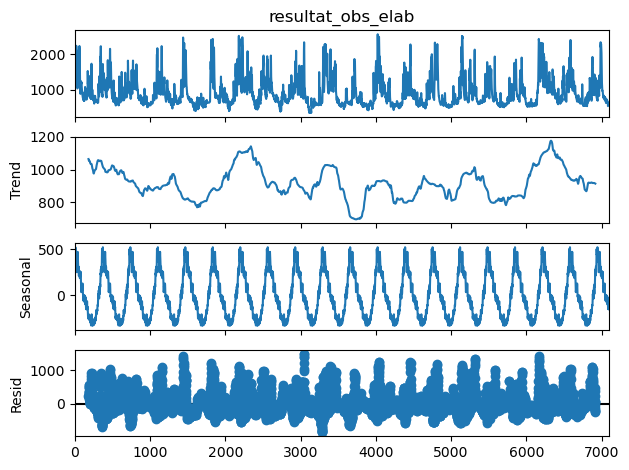

<Figure size 1200x800 with 0 Axes>

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Seasonal decomposition using moving averages.
decomposition = seasonal_decompose(data_df[TARGET_COLUMN_NAME], period=365)

# Plot the decomposition results
fig = decomposition.plot()
# increase the size of the plot using smatplotlib
plt.figure(figsize=(12, 8))
fig.show();

In [17]:
# =======================================================================
# I) Exploratory Data Analysis (EDA) + Time Series Visualization
# =======================================================================

# I.1. Select the relevant columns and rename them to "ds" and "y"
clean_data_df = data_df[[DATETIME_COLUMN_NAME, TARGET_COLUMN_NAME]].copy()
clean_data_df = clean_data_df.rename(columns={DATETIME_COLUMN_NAME: "ds", 
                                        TARGET_COLUMN_NAME: "y"
                                        })

# I.2. Ensure the "ds" column is a proper datetime type.
# Note: Prophet often prefers timezone-naive datetimes, so we remove the timezone if it exists.
clean_data_df["ds"] = pd.to_datetime(clean_data_df["ds"]).dt.tz_localize(None)

# Sort the DataFrame by the datetime column to ensure proper feature creation and time series analysis
clean_data_df = clean_data_df.sort_values("ds")

# I.3. Ensure "y" is numeric
# clean_data_df["y"] = pd.to_numeric(clean_data_df["y"], errors="coerce")

# # Optional: drop any rows with NaN values in "y" as they can cause issues
# clean_data_df = clean_data_df.dropna(subset=["y"])


**Distribution of the target variable (water level) over time**

**Source flood thresholds:** https://www.vigicrues.gouv.fr/station/A236003001/station/A236003001

In [18]:
# I.4. Time Series With Range Slider
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=clean_data_df["ds"], y=clean_data_df["y"], mode="lines", name=f"Water Height ({TARGET_VARIABLE_NOTATION})"))
# fig1.add_trace(go.Scatter(gold_ts, x="Date", y="Close", mode="lines", name="Close"))
# fig1.add_trace(go.Scatter(gold_ts, x="Date", y=gold_ts.columns, mode="lines", name="Close"))
# Customize the current trace
fig1.update_traces(line_color="blue", name=f"Water Height ({TARGET_VARIABLE_NOTATION})", showlegend=True)
# add horizontal line for flood threshold (example: 2.86) in April 1983
fig1.add_hline(y=2.86*1000, line_dash="dash", line_color="red", annotation_text="Flood Threshold (2.86) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig1.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text="Flood Threshold (2.77) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig1.add_hline(y=2.58*1000, line_dash="dash", line_color="green", annotation_text="Flood Threshold (2.58) in January 2018", annotation_position="bottom left")
# Customize the layout of the figure
fig1.update_layout(
    title=f"{TITLE_POSTFIX_NAME} : Water Height Over Time",
    title_x=0.5,
    title_font=dict(size=24, color="black", family="Arial", weight="bold"),
    xaxis_title="Datetime", 
    yaxis_title=f"Water Height ({TARGET_VARIABLE_NOTATION})",
    legend_title="Legend",
#   showlegend=True,
#   legend=dict(x=0.01, y=0.99, bgcolor="rgba(255, 255, 255, 0.5)", bordercolor="black", borderwidth=1),
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"), # 1 day
                dict(count=7, label="7d", step="day", stepmode="backward"), # 7 days
                dict(count=1, label="1m", step="month", stepmode="backward"), # 1 month
                dict(count=3, label="3m", step="month", stepmode="backward"), # 3 months
                dict(count=6, label="6m", step="month", stepmode="backward"), # 6 months
                dict(count=1, label="YTD", step="year", stepmode="todate"), # Year to date
                dict(count=1, label="1y", step="year", stepmode="backward"), # 1 year
                dict(step="all") # All data 
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    ),
    # Size of the figure
    width=1200, height=600
)
# plot and save the figure as an HTML and png file
fig1.write_html(local_artifact_dir / f"01_time_series_plot_{FILE_POSTFIX_NAME}.html")
# fig1.write_image(local_artifact_dir / f"01_time_series_plot_{FILE_POSTFIX_NAME}.png")
fig1.show()

# <a id='toc2_'></a>[B) Baseline: Prophet](#toc0_)

We also have to prepare the data for Prophet, which expects its input columns to be named:

- **ds** → **datestamp**
- **y** → **value to forecast** (here, the "Close" price)

**Train/Test Split of the data for time series forecasting with Prophet**

## <a id='toc2_1_'></a>[Data Preparation for Prophet](#toc0_)

In [98]:
# =======================================================================
# II) Train/Test Split of the data for time series forecasting with Prophet
# =======================================================================

# # *==== Method 1 ====: using split date to create a boolean mask for selecting the train and test sets
# # Set the split date for train/test split 
# # (example: "2024-01-01" to use all data up to the end of 2023 for training and the rest for testing) 
# SPLIT_DATE = "2024-01-01"

# # mask_selection = data_df.index < SPLIT_DATE
# # train_fbp = data_df[mask_selection]
# # test_fbp = data_df[~mask_selection]
# train_fbp = clean_data_df.loc[clean_data_df["ds"] <= SPLIT_DATE].copy()
# test_fbp = clean_data_df.loc[clean_data_df["ds"] > SPLIT_DATE].copy()


# *====Method 2====:  Proper Data Splitting
# CRITICAL: Use chronological split, NOT random split!
TRAIN_SIZE_RATIO = 0.8
train_size = int(len(clean_data_df) * TRAIN_SIZE_RATIO)
train_fbp = clean_data_df[:train_size]
test_fbp = clean_data_df[train_size:]

# Get the last date of the training set for reference
SPLIT_DATE = train_fbp["ds"].iloc[-1]  # get the last date of the training set as the split date

print(f"Using SPLIT_DATE: {SPLIT_DATE} for train/test split")
print(f"Train: {len(train_fbp)}, Test: {len(test_fbp)}")
print("Train set shape:", train_fbp.shape)
display(train_fbp)
print("\nTest set shape:", test_fbp.shape)
display(test_fbp)

# save the train and test sets as csv files
train_fbp.to_csv(local_artifact_dir / f"train_fbp_{FILE_POSTFIX_NAME}.csv", index=False)
test_fbp.to_csv(local_artifact_dir / f"test_fbp_{FILE_POSTFIX_NAME}.csv", index=False)
# print(train_fbp)

Using SPLIT_DATE: 2022-07-18 00:00:00 for train/test split
Train: 5678, Test: 1420
Train set shape: (5678, 2)


,ds,y
0,2007-01-01,1207.0
1,2007-01-02,1554.0
2,2007-01-03,1675.0
3,2007-01-04,1677.0
4,2007-01-05,1590.0
...,...,...
5673,2022-07-14,542.0
5674,2022-07-15,537.0
5675,2022-07-16,531.0
5676,2022-07-17,530.0



Test set shape: (1420, 2)


,ds,y
5678,2022-07-19,521.0
5679,2022-07-20,545.0
5680,2022-07-21,648.0
5681,2022-07-22,562.0
5682,2022-07-23,543.0
...,...,...
7093,2026-06-03,626.0
7094,2026-06-04,614.0
7095,2026-06-05,601.0
7096,2026-06-06,592.0


In [99]:
# calculate percentage of test set size
percent_train = train_fbp.shape[0]*100/clean_data_df.shape[0]
percent_test = test_fbp.shape[0]*100/clean_data_df.shape[0]

print(f"Train set: {train_fbp.shape[0]} rows")
print(f"Test set: {test_fbp.shape[0]} rows")
print(f"==> Train set percentage: {percent_train:.2f}%")
print(f"==> Test set percentage: {percent_test:.2f}%")
print(f" dataset size: {clean_data_df.shape[0]} rows")
print(f"Total size train + test: {train_fbp.shape[0] + test_fbp.shape[0]} rows")

Train set: 5678 rows
Test set: 1420 rows
==> Train set percentage: 79.99%
==> Test set percentage: 20.01%
 dataset size: 7098 rows
Total size train + test: 7098 rows


**Checking**: Visualize the train/test split using plotly to ensure it’s done correctly.

**Source flood thresholds:** https://www.vigicrues.gouv.fr/station/A236003001/station/A236003001

In [100]:
# Visualize the train/test split using plotly
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=train_fbp["ds"], y=train_fbp["y"], mode="lines", name="Train Set"))
fig2.add_trace(go.Scatter(x=test_fbp["ds"], y=test_fbp["y"], mode="lines", name="Test Set"))
fig2.add_vline(x=SPLIT_DATE, line_dash="dash", line_color="black")
# fig2.add_vline(x=SPLIT_DATE, line_dash="dash", line_color="red", annotation_text="Train-Test split line", annotation_position="top left")
# Customize the layout of the figure
fig2.update_layout(title=f"Data Train/Test Split - Water Height Over Time - {TITLE_POSTFIX_NAME}",
                title_x=0.5,
                title_font=dict(size=24, color="black", family="Arial", weight="bold"),
                xaxis_title="Datetime", 
                yaxis_title="Water Height",
                legend_title="Legend",
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor="rgba(255, 255, 255, 0.5)", bordercolor="black", borderwidth=1),
                # Size of the figure
                width=1200, height=600)
# plot and save the figure as an HTML and png file
fig2.write_html(local_artifact_dir / f"02_train_test_split_plot_{FILE_POSTFIX_NAME}.html")
# fig2.write_image(local_artifact_dir / f"02_train_test_split_plot_{FILE_POSTFIX_NAME}.png")
fig2.show()

## <a id='toc2_2_'></a>[Initialize and train the Prophet model](#toc0_)

In [20]:
# =======================================================================
# III) Initialize and train the Prophet model
# =======================================================================
start_time = time.time()
print(f"{start_time} -> Training baseline model...")

# Set the growth parameter for the Prophet model to "linear" to model a linear trend in the water height data over time.        
growth = "linear"  # "flat" or "logistic" if you have a cap and floor in your data, but for water height, linear is often more appropriate unless there are known limits to the values.

# Initialize the Prophet model with or without seasonality components (daily, weekly, yearly) based on the seasonality variable
seasonality = False # args.seasonality # Include seasonality components (True or False)
changepoint_prior_scale = 0.05 # args.changepoint_prior_scale # Changepoint prior scale
seasonality_prior_scale = 10 # args.seasonality_prior_scale # Seasonality prior scale
enabled_seasonality = cast(Any, True) # Enable all seasonality components (daily, weekly, yearly) by default; Prophet will automatically determine which ones to use based on the data and the seasonality_prior_scale parameter. Setting this to True allows Prophet to include any relevant seasonality components without having to specify each one individually.

if seasonality:
    prophet_model = Prophet(growth=growth,) # = Prophet() if growth is linear
else:
    if changepoint_prior_scale != 0.05 and seasonality_prior_scale != 10:
        prophet_model = Prophet(growth=growth,
                                changepoint_prior_scale=changepoint_prior_scale,
                                seasonality_prior_scale=seasonality_prior_scale,
                                yearly_seasonality=enabled_seasonality,
                                weekly_seasonality=enabled_seasonality,
                                daily_seasonality=enabled_seasonality,
                            )
    else:
        prophet_model = Prophet(growth=growth,
                                daily_seasonality=enabled_seasonality, 
                                weekly_seasonality=enabled_seasonality, 
                                yearly_seasonality=enabled_seasonality)

# Fit the Prophet model on the training data
prophet_model.fit(train_fbp)

# =======================================================================
# IV) Predict on test set with model
# =======================================================================

test_fbp_prophet = test_fbp.reset_index().rename(columns={DATETIME_COLUMN_NAME:"ds"})
test_fcst = prophet_model.predict(test_fbp_prophet[["ds"]])

# save the forecasted results as a csv file
test_fcst.to_csv(local_artifact_dir / f"test_forecast_{FILE_POSTFIX_NAME}.csv", index=False)
# print the forecasted results
display(test_fcst)

1780988879.9040117 -> Training baseline model...


09:08:00 - cmdstanpy - INFO - Chain [1] start processing
09:08:01 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-01-02,1027.626016,948.730363,1775.455287,1027.626016,1027.626016,336.223022,336.223022,336.223022,-101.702631,...,3.639447,3.639447,3.639447,434.286206,434.286206,434.286206,0.0,0.0,0.0,1363.849039
1,2024-01-03,1027.659901,980.588599,1758.586704,1027.659901,1027.659901,328.490047,328.490047,328.490047,-101.702631,...,-1.038335,-1.038335,-1.038335,431.231013,431.231013,431.231013,0.0,0.0,0.0,1356.149948
2,2024-01-04,1027.693786,940.558709,1776.974341,1027.693786,1027.693786,320.367568,320.367568,320.367568,-101.702631,...,-5.328515,-5.328515,-5.328515,427.398715,427.398715,427.398715,0.0,0.0,0.0,1348.061354
3,2024-01-05,1027.727670,965.789079,1740.338298,1027.727670,1027.727670,318.045505,318.045505,318.045505,-101.702631,...,-3.188078,-3.188078,-3.188078,422.936214,422.936214,422.936214,0.0,0.0,0.0,1345.773176
4,2024-01-06,1027.761555,945.591677,1756.042023,1027.761555,1027.761555,314.571891,314.571891,314.571891,-101.702631,...,-1.719480,-1.719480,-1.719480,417.994003,417.994003,417.994003,0.0,0.0,0.0,1342.333446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
883,2026-06-03,1057.546219,397.420583,1274.215550,1006.255398,1110.443885,-224.942302,-224.942302,-224.942302,-101.702631,...,-1.038335,-1.038335,-1.038335,-122.201336,-122.201336,-122.201336,0.0,0.0,0.0,832.603917
884,2026-06-04,1057.580103,410.463319,1248.263821,1006.195231,1110.641636,-231.998122,-231.998122,-231.998122,-101.702631,...,-5.328515,-5.328515,-5.328515,-124.966976,-124.966976,-124.966976,0.0,0.0,0.0,825.581981
885,2026-06-05,1057.613988,380.719506,1221.112733,1006.135063,1110.839387,-232.373537,-232.373537,-232.373537,-101.702631,...,-3.188078,-3.188078,-3.188078,-127.482828,-127.482828,-127.482828,0.0,0.0,0.0,825.240451
886,2026-06-06,1057.647873,392.812195,1266.728542,1006.074895,1111.037138,-233.174584,-233.174584,-233.174584,-101.702631,...,-1.719480,-1.719480,-1.719480,-129.752473,-129.752473,-129.752473,0.0,0.0,0.0,824.473289


**Plot the components of the model**

C:\Users\zef\AppData\Local\Temp\ipykernel_122756\2733114520.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig3.show()


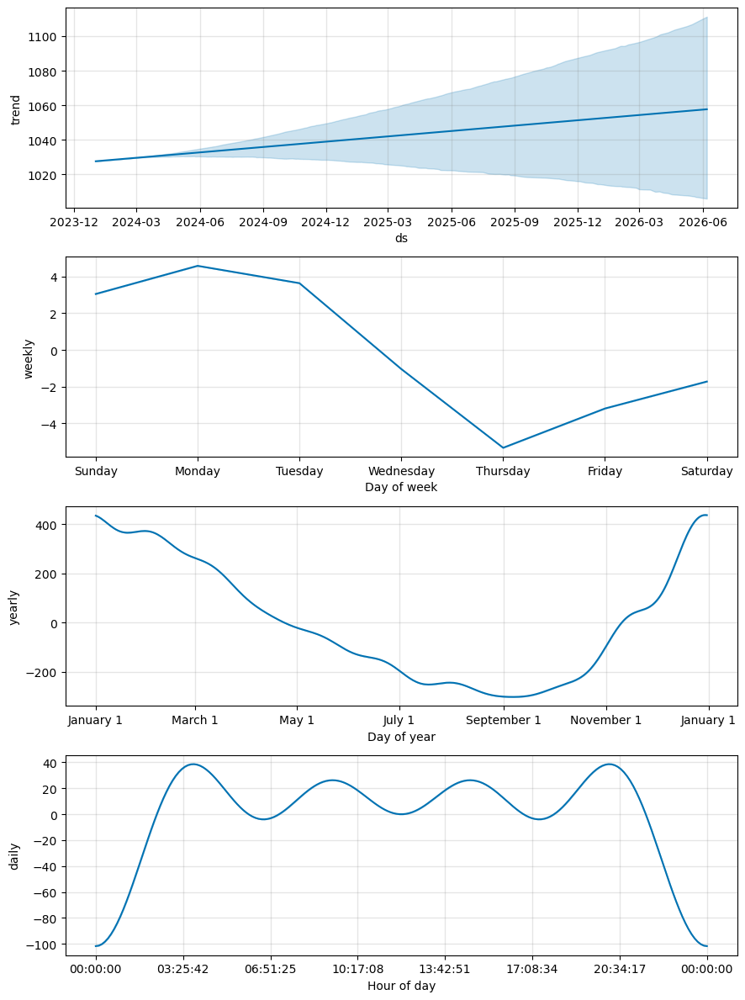

In [21]:
# Plot the components of the model
fig3 = prophet_model.plot_components(test_fcst)
# save the figure as an HTML and png file
fig3.savefig(local_artifact_dir / f"03_prophet_components_plot_{FILE_POSTFIX_NAME}.png")
fig3.show()

In [22]:
# Plot the components of the model using plotly
fig4 = make_subplots(rows=4, cols=1, subplot_titles=["Trend", "Weekly Seasonality", "Yearly Seasonality", "Daily Seasonality"])
fig4.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["trend"], mode="lines", name="Trend"), row=1, col=1)
fig4.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["weekly"], mode="lines", name="Weekly Seasonality"), row=2, col=1)
fig4.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["yearly"], mode="lines", name="Yearly Seasonality"), row=3, col=1)
fig4.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["daily"], mode="lines", name="Daily Seasonality"), row=4, col=1)
# Customize the layout of the figure
fig4.update_layout(title=f"Prophet Model Components - Water Height Over Time - {TITLE_POSTFIX_NAME}",
                title_x=0.5,
                    title_font=dict(size=24, color="black", family="Arial", weight="bold"),
                    xaxis_title="Datetime", 
                    yaxis_title="Component Value",
                    legend_title="Legend",
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor="rgba(255, 255, 255, 0.5)", bordercolor="black", borderwidth=1),
                    height=900, width=1200)
# save the figure as an HTML and png file
fig4.write_html(local_artifact_dir / f"04_prophet_components_plot_{FILE_POSTFIX_NAME}.html")
# fig4.write_image(local_artifact_dir / f"04_prophet_components_plot_{FILE_POSTFIX_NAME}.png")
fig4.show()

**Create a future dataframe and forecast**

In [23]:
# =======================================================================
# V) Create a future dataframe and generate forecast
# =======================================================================

# make_future_dataframe is a method of the Prophet model that creates a DataFrame with future dates for which we want to generate forecasts. 
# The periods parameter specifies how many future time points to predict, 
# and the freq parameter specifies the frequency of the time points (e.g., "D" for daily, "H" for hourly). 
# The resulting DataFrame will contain a "ds" column with the future dates, which can then be used to generate forecasts using the predict method of the Prophet model.

# Simulate the trend using the extrapolated generative model.
# Periods: Number of future time points to predict (e.g., 365 for one year of daily predictions)
# for N years of daily predictions, use periods=365 * N
# The make_future_dataframe method creates a DataFrame that extends the historical data with future dates, which is then used to generate forecasts using 
# the predict method of the loaded Prophet model.

# # Forecasting the next 24 hours (freq="H") -> 1 day only
# future = prophet_model.make_future_dataframe(periods=24, freq="H")
# Forecasting the next 30 days (freq="D") -> 1 month only
# future = prophet_model.make_future_dataframe(periods=30, freq="D") 
# # Forecasting the next 365 days (freq="D") -> 1 year only
# future = prophet_model.make_future_dataframe(periods=365, freq="D")
NUM_YEARS_TO_PREDICT = 3
future = prophet_model.make_future_dataframe(periods=365*NUM_YEARS_TO_PREDICT, freq="D")
# # Forecasting the next 30 days (freq="D") with daily seasonality only
# future = prophet_model.make_future_dataframe(periods=30, freq="D", include_history=True)
# # Forecasting the next 1 year (freq="D") with daily seasonality only
# future = prophet_model.make_future_dataframe(periods=365, freq="D", include_history=True)

print(f"Future dataframe for the next {NUM_YEARS_TO_PREDICT} years:")
display(future)

# Generate the forecast for the future dataframe for the next 24 hours or 30 days
forecast = prophet_model.predict(future)

# save the forecasted results as a csv file
forecast.to_csv(local_artifact_dir / f"future_forecast_{FILE_POSTFIX_NAME}.csv", index=False)
print(f"Forecasted results for the next {NUM_YEARS_TO_PREDICT} years:")
display(forecast)

Future dataframe for the next 3 years:


,ds
0,2007-01-01
1,2007-01-02
2,2007-01-03
3,2007-01-04
4,2007-01-05
...,...
7300,2026-12-27
7301,2026-12-28
7302,2026-12-29
7303,2026-12-30


Forecasted results for the next 3 years:


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2007-01-01,1178.976926,1112.591780,1925.813386,1178.976926,1178.976926,338.864245,338.864245,338.864245,-101.702631,...,4.583788,4.583788,4.583788,435.983088,435.983088,435.983088,0.0,0.0,0.0,1517.841171
1,2007-01-02,1178.799463,1076.605140,1919.284472,1178.799463,1178.799463,335.539881,335.539881,335.539881,-101.702631,...,3.639447,3.639447,3.639447,433.603065,433.603065,433.603065,0.0,0.0,0.0,1514.339344
2,2007-01-03,1178.621999,1085.649835,1935.956426,1178.621999,1178.621999,327.599181,327.599181,327.599181,-101.702631,...,-1.038335,-1.038335,-1.038335,430.340147,430.340147,430.340147,0.0,0.0,0.0,1506.221181
3,2007-01-04,1178.444536,1084.374283,1919.668531,1178.444536,1178.444536,319.305181,319.305181,319.305181,-101.702631,...,-5.328515,-5.328515,-5.328515,426.336328,426.336328,426.336328,0.0,0.0,0.0,1497.749717
4,2007-01-05,1178.267073,1083.456364,1914.073864,1178.267073,1178.267073,316.849016,316.849016,316.849016,-101.702631,...,-3.188078,-3.188078,-3.188078,421.739725,421.739725,421.739725,0.0,0.0,0.0,1495.116089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,2026-12-27,1064.560354,958.969612,1822.532473,984.266090,1137.749942,331.849242,331.849242,331.849242,-101.702631,...,3.051173,3.051173,3.051173,430.500700,430.500700,430.500700,0.0,0.0,0.0,1396.409596
7301,2026-12-28,1064.594239,967.255574,1849.815824,984.141508,1137.953966,337.110584,337.110584,337.110584,-101.702631,...,4.583788,4.583788,4.583788,434.229427,434.229427,434.229427,0.0,0.0,0.0,1401.704823
7302,2026-12-29,1064.628124,983.281290,1817.404249,984.025998,1138.157990,338.503000,338.503000,338.503000,-101.702631,...,3.639447,3.639447,3.639447,436.566183,436.566183,436.566183,0.0,0.0,0.0,1403.131124
7303,2026-12-30,1064.662009,1000.990408,1821.098588,984.056461,1138.362013,334.835872,334.835872,334.835872,-101.702631,...,-1.038335,-1.038335,-1.038335,437.576838,437.576838,437.576838,0.0,0.0,0.0,1399.497881


C:\Users\zef\AppData\Local\Temp\ipykernel_122756\1747141234.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig5.show()


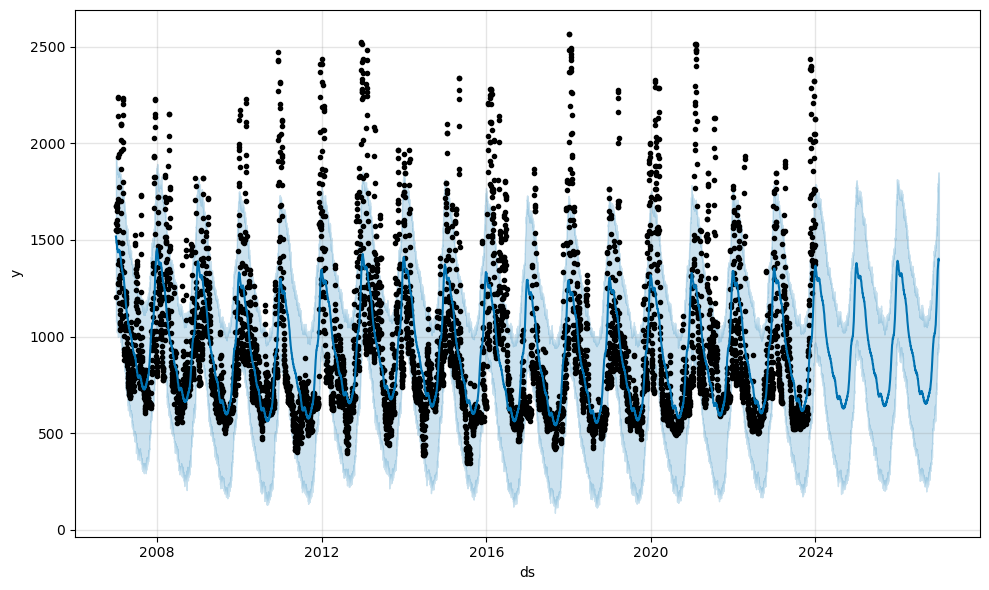

In [24]:
# Plot the forecasted results
fig5 = prophet_model.plot(forecast)
fig5.savefig(local_artifact_dir / f"05_prophet_forecast_plot_{FILE_POSTFIX_NAME}.png")
fig5.show()

In [25]:
# Plot the forecasted results using plotly
fig6 = go.Figure()
fig6.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat"], mode="lines", name="Forecasted Water Height (yhat)"))
fig6.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat_lower"], mode="lines", name="Lower Confidence Interval (yhat_lower)", line=dict(dash="dash", color="red")))
fig6.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat_upper"], mode="lines", name="Upper Confidence Interval (yhat_upper)", line=dict(dash="dash", color="green")))
# Customize the layout of the figure
fig6.update_layout(title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
                title_x=0.5,
                    title_font=dict(size=24, color="black", family="Arial", weight="bold"),
                    xaxis_title="Datetime", 
                    yaxis_title="Water Height",
                    legend_title="Legend",
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor="rgba(255, 255, 255, 0.5)", bordercolor="black", borderwidth=1),
                    height=900, width=1200)
# save the figure as an HTML and png file
fig6.write_html(local_artifact_dir / f"06_prophet_forecast_plot_{FILE_POSTFIX_NAME}.html")
# fig6.write_image(local_artifact_dir / f"06_prophet_forecast_plot_{FILE_POSTFIX_NAME}.png")
fig6.show()

In [26]:
# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp["ds"], y=train_fbp["y"], mode="lines+markers", name="Actual (Training)", line=dict(color="blue")))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp["ds"], y=test_fbp["y"], mode="lines+markers", name="Actual (Test)", line=dict(color="green")))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat"], mode="lines", name="Forecast", line=dict(color="red")))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat_upper"], fill=None, mode="lines", 
                        line_color="rgba(0,0,0,0)", showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast["ds"], y=forecast["yhat_lower"], fill="tonexty", mode="lines", 
                        line_color="rgba(0,0,0,0)", name="Confidence Interval", 
                        fillcolor="rgba(255,0,0,0.2)"))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="darkred", annotation_text="Flood Threshold (2.86) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text="Flood Threshold (2.77) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="fuchsia", annotation_text="Flood Threshold (2.58) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

Baseline metrics computed successfully.
Mean Absolute Percentage Error (MAPE): 0.25
R^2 score: 0.26
Mean Squared Error (MSE): 113900.66
Root Mean Squared Error (RMSE): 337.49
Mean Absolute Error (MAE): 251.20


C:\Users\zef\AppData\Local\Temp\ipykernel_122756\1487296954.py:87: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig8.show()


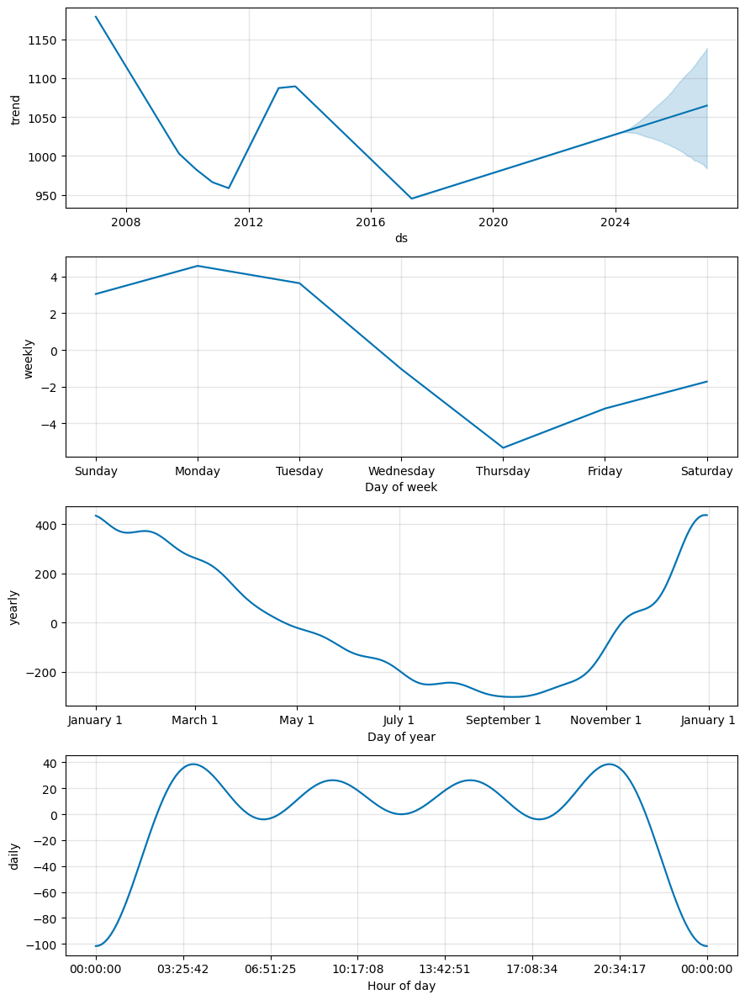

In [27]:
# =======================================================================
# VI) Compute the metrics (MAPE, R^2, RMSE, MAE) to evaluate the forecast accuracy
# =======================================================================

# We now measure how accurate the forecast is. If there’s no overlap in dates, it warns you instead of crashing.

#VI.1. Align predictions with actuals
# Join actual water height with model predictions on matching dates to compare them directly.

# Join actual closing prices with model predictions on matching dates to compare them directly.
# We merge the test dataframe (which contains the actual closing prices for the test period) with the forecast dataframe (which contains the predicted values for the same period) on the "ds" column, 
# which represents the dates.
# The merge is done using an inner join, which means that only the rows with matching dates in both dataframes will be included in the resulting merged dataframe.
merged = pd.merge(test_fbp, forecast[["ds", "yhat"]], on="ds", how="inner")

# print("\nMerged dataframe created:")
# print(type(merged))
# print("\nThe first 5 rows of the merged dataframe:")
# print(merged.head())
# print("\nThe last 5 rows of the merged dataframe:")
# print(merged.tail())

# VI.2. Compute (r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error)
# We now measure how accurate the forecast is. If there’s no overlap in dates, it warns you instead of crashing.

mape = float("nan")
r2 = float("nan")
mse = float("nan")
rmse = float("nan")
mae = float("nan")
prophet_metrics = {}

if merged.empty:
    # If the merged dataframe is empty, it means there are no overlapping dates between the test set and the forecasted values, 
    # so we print a message indicating that.
    print("No overlapping dates between forecast and test set.")
else:
    y_actual, y_predicted = merged["y"], merged["yhat"]
    # If the merged dataframe is not empty, it means there are overlapping dates between the test set and the forecasted values, 
    # calculate the Mean Absolute Percentage Error (MAPE) between the actual values (y) and the predicted values (yhat).
    mape = mean_absolute_percentage_error(y_actual, y_predicted)
    # calculate the r^2 score
    r2 = r2_score(y_actual, y_predicted)
    # calculate the mean squared error (MSE)
    mse = mean_squared_error(y_actual, y_predicted)
    # calculate the root mean squared error (RMSE)
    rmse = root_mean_squared_error(y_actual, y_predicted) # = np.sqrt(mse)
    # calculate the mean absolute error (MAE)
    mae = mean_absolute_error(y_actual, y_predicted)
    
    #save prophet metrics into a dictionary for later logging to MLflow
    prophet_metrics = {"std_mape": mape,
                        "std_r2": r2,
                        "std_mse": mse,
                        "std_rmse": rmse,
                        "std_mae": mae}
    
    # print(f"[INFO] Baseline Run ID: {parent_run.info.run_id}")
    print("===="*20)
    print("Baseline metrics computed successfully.")
    print("===="*20)
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}")
    print(f"R^2 score: {r2:.2f}")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    
    # with open(local_artifact_dir / f"train_{FILE_POSTFIX_NAME}_{Current_time}.txt", "w") as f:
    #     f.write(f"Current date and time: {Current_time}\n")
    #     f.write(f"{TITLE_POSTFIX_NAME}\n")
    #     f.write("Model Type: Prophet\n")
    #     f.write("\nParameters:\n")
    #     f.write(f"\t-Seasonality: {args.seasonality}\n")
    #     f.write("\nThis is an artifact file containing the standard Prophet evaluation metrics of the model:\n")
    #     for key, value in prophet_metrics.items():
    #         f.write(f"\t-{key}: {value}\n")
    #     f.write("\nSettings for the deployment &inference:\n")
    #     f.write(f"MLflow Experiment Name <MLFLOW_EXPERIMENT_NAME>: {MLFLOW_EXPERIMENT_NAME}\n")
    #     f.write(f"Registered Model Name <REGISTERED_MODEL_NAME>: {REGISTERED_MODEL_NAME}\n")
    #     f.write(f"Model Alias Name <MODEL_ALIAS_NAME>: {MODEL_ALIAS_NAME}\n")

# VI. Plot seasonal components
# It"s helpful to show how trend, daily, and yearly seasonality patterns contribute to the forecast.

fig8 = prophet_model.plot_components(forecast)
fig8.savefig(local_artifact_dir / f"08_prophet_seasonal_components_plot_{FILE_POSTFIX_NAME}.png")
fig8.show()

In [28]:
# Use plotly to plot seasonal components
fig9 = make_subplots(rows=4, cols=1, subplot_titles=["Trend", "Weekly Seasonality", "Yearly Seasonality", "Daily Seasonality"])
fig9.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["trend"], mode="lines", name="Trend"), row=1, col=1)
fig9.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["weekly"], mode="lines", name="Weekly Seasonality"), row=2, col=1)
fig9.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["yearly"], mode="lines", name="Yearly Seasonality"), row=3, col=1)
fig9.add_trace(go.Scatter(x=test_fcst["ds"], y=test_fcst["daily"], mode="lines", name="Daily Seasonality"), row=4, col=1)
# Customize the layout of the figure
fig9.update_layout(title=f"Prophet Seasonal Components - Water Height Over Time - {TITLE_POSTFIX_NAME}",
                title_x=0.5,
                    title_font=dict(size=24, color="black", family="Arial", weight="bold"),
                    xaxis_title="Datetime", 
                    yaxis_title="Component Value",
                    legend_title="Legend",
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor="rgba(255, 255, 255, 0.5)", bordercolor="black", borderwidth=1),
                    height=900, width=1200)
# save the figure as an HTML and png file
fig9.write_html(local_artifact_dir / f"09_prophet_seasonal_components_plot_{FILE_POSTFIX_NAME}.html")
# fig9.write_image(local_artifact_dir / f"09_prophet_seasonal_components_plot_{FILE_POSTFIX_NAME}.png")
fig9.show()

## <a id='toc2_3_'></a>[Tests of parameters optimization of Prophet Model](#toc0_)

- Try Multiple Prophet parameter configurations

In [30]:
# Configuration variations to test
configs = [
    # Basic
    {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10},
    # More flexible
    {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 10},
    # Less flexible
    {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1},
]

best_mape = 0.1 # float('inf')
best_model = None

for config in configs:
    prophet_model_optimz = Prophet(**config)
    prophet_model_optimz.fit(train)  # train must have 'ds' and 'y' columns
    
    # Forecast on validation set
    future = prophet_model_optimz.make_future_dataframe(periods=len(val))
    forecast = prophet_model_optimz.predict(future)
    
    # Calculate MAPE
    pred_vals = forecast['yhat'].tail(len(val)).values
    actual_vals = val['y'].values
    mape = np.mean(np.abs((actual_vals - pred_vals) / actual_vals)) * 100
    
    if mape < best_mape:
        best_mape = mape
        best_model = prophet_model_optimz
        print(f"New best model found with config {config} and MAPE = {mape:.2f}%")
    
    print(f"Config {config}: MAPE = {mape:.2f}%")

09:09:09 - cmdstanpy - INFO - Chain [1] start processing
09:09:10 - cmdstanpy - INFO - Chain [1] done processing


Config {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10}: MAPE = 25.18%


09:09:11 - cmdstanpy - INFO - Chain [1] start processing
09:09:14 - cmdstanpy - INFO - Chain [1] done processing


Config {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 10}: MAPE = 22.68%


09:09:16 - cmdstanpy - INFO - Chain [1] start processing
09:09:16 - cmdstanpy - INFO - Chain [1] done processing


Config {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1}: MAPE = 23.35%


## <a id='toc2_4_'></a>[Feature Engineering](#toc0_)

- **Shift(X)**: is function that allows us to create lag features, which can capture the influence of past values on the current value. For example, `df['lag_1'] = df['y'].shift(1)` creates a new column 'lag_1' that contains the value of 'y' from the previous time step. This can help the model learn temporal dependencies in the data.
- **rolling(X)**: is function that allows us to create rolling statistics, which can capture trends and patterns over a specified window of past values. For example, `df['rolling_mean_7'] = df['y'].rolling(7).mean()` creates a new column 'rolling_mean_7' that contains the mean of 'y' over the past 7 time steps. This can help the model learn longer-term trends in the data.
- **ffill()** and **bfill()** are methods used to handle missing values in a DataFrame. ffill() (forward fill) propagates the last valid observation forward to fill NaN values, while bfill() (backward fill) uses the next valid observation to fill NaN values. These methods are often used after creating lag or rolling features, which can introduce NaN values at the beginning of the dataset.

In [106]:
# Add exogenous variables if available
# Exogeneous variables (lag features, rolling means, etc.) can help improve the forecast if they are relevant to the target variable.
exog_data_df = clean_data_df.copy()
exog_data_df['lag_1'] = exog_data_df['y'].shift(1)
exog_data_df['lag_7'] = exog_data_df['y'].shift(7)
exog_data_df['rolling_mean_7'] = exog_data_df['y'].rolling(7).mean()

# Prophet doesn't natively support external regressors well, but you can add them via add_regressor()
prophet_model_exog = Prophet()
prophet_model_exog.add_regressor('lag_1')
prophet_model_exog.add_regressor('lag_7')
prophet_model_exog.add_regressor('rolling_mean_7')

# Drop rows with NaN values from lag/rolling features
df_exog = exog_data_df.dropna().copy()
prophet_model_exog.fit(df_exog)

# Forecast with exogenous variables
future_exog = prophet_model_exog.make_future_dataframe(periods=365)

# We need to create the same lag and rolling features for the future dataframe.
future_exog = future_exog.merge(exog_data_df[['ds', 'y']], on='ds', how='left')
future_exog['y'] = future_exog['y'].ffill()
future_exog['lag_1'] = future_exog['y'].shift(1)
future_exog['lag_7'] = future_exog['y'].shift(7)
future_exog['rolling_mean_7'] = future_exog['y'].rolling(7, min_periods=1).mean()
future_exog[['lag_1', 'lag_7', 'rolling_mean_7']] = future_exog[['lag_1', 'lag_7', 'rolling_mean_7']].bfill().ffill()

# Run the forecast with exogenous variables (make sure to drop NaN rows due to lag/rolling features)
forecast_exog = prophet_model_exog.predict(future_exog[['ds', 'lag_1', 'lag_7', 'rolling_mean_7']].dropna())

11:41:31 - cmdstanpy - INFO - Chain [1] start processing
11:41:34 - cmdstanpy - INFO - Chain [1] done processing


In [110]:
display(exog_data_df)
display(future_exog)
display(forecast_exog)

,ds,y,lag_1,lag_7,rolling_mean_7
0,2007-01-01,1207.0,NaN,NaN,NaN
1,2007-01-02,1554.0,1207.0,NaN,NaN
2,2007-01-03,1675.0,1554.0,NaN,NaN
3,2007-01-04,1677.0,1675.0,NaN,NaN
4,2007-01-05,1590.0,1677.0,NaN,NaN
...,...,...,...,...,...
7093,2026-06-03,626.0,627.0,565.0,590.000000
7094,2026-06-04,614.0,626.0,574.0,595.714286
7095,2026-06-05,601.0,614.0,573.0,599.714286
7096,2026-06-06,592.0,601.0,566.0,603.428571


,ds,y,lag_1,lag_7,rolling_mean_7
0,2007-01-08,1578.0,1578.0,1578.0,1578.000000
1,2007-01-09,1665.0,1578.0,1578.0,1621.500000
2,2007-01-10,1693.0,1665.0,1578.0,1645.333333
3,2007-01-11,1687.0,1693.0,1578.0,1655.750000
4,2007-01-12,1671.0,1687.0,1578.0,1658.800000
...,...,...,...,...,...
7451,2027-06-03,581.0,581.0,581.0,581.000000
7452,2027-06-04,581.0,581.0,581.0,581.000000
7453,2027-06-05,581.0,581.0,581.0,581.000000
7454,2027-06-06,581.0,581.0,581.0,581.000000


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2007-01-08,934.443233,1462.933524,1688.740545,934.443233,934.443233,638.861489,638.861489,638.861489,612.489067,...,0.754263,0.754263,0.754263,25.618159,25.618159,25.618159,0.0,0.0,0.0,1573.304722
1,2007-01-09,934.430902,1441.117571,1665.528551,934.430902,934.430902,625.539256,625.539256,625.539256,602.077347,...,-1.685764,-1.685764,-1.685764,25.147674,25.147674,25.147674,0.0,0.0,0.0,1559.970158
2,2007-01-10,934.418570,1550.190519,1759.613056,934.418570,934.418570,716.972872,716.972872,716.972872,695.943476,...,-3.654767,-3.654767,-3.654767,24.684163,24.684163,24.684163,0.0,0.0,0.0,1651.391442
3,2007-01-11,934.406239,1568.378310,1793.839561,934.406239,934.406239,747.605285,747.605285,747.605285,725.495969,...,-2.123677,-2.123677,-2.123677,24.232993,24.232993,24.232993,0.0,0.0,0.0,1682.011524
4,2007-01-12,934.393907,1557.741039,1802.997155,934.393907,934.393907,744.788398,744.788398,744.788398,717.899012,...,3.090189,3.090189,3.090189,23.799197,23.799197,23.799197,0.0,0.0,0.0,1679.182305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7451,2027-06-03,927.754196,477.936494,716.346353,927.165860,928.463872,-333.185636,-333.185636,-333.185636,-321.903190,...,-2.123677,-2.123677,-2.123677,-9.158769,-9.158769,-9.158769,0.0,0.0,0.0,594.568561
7452,2027-06-04,927.756306,482.872082,706.543086,927.166138,928.468718,-328.025478,-328.025478,-328.025478,-321.903190,...,3.090189,3.090189,3.090189,-9.212477,-9.212477,-9.212477,0.0,0.0,0.0,599.730828
7453,2027-06-05,927.758416,484.211607,705.261253,927.166523,928.476266,-331.336192,-331.336192,-331.336192,-321.903190,...,-0.163248,-0.163248,-0.163248,-9.269754,-9.269754,-9.269754,0.0,0.0,0.0,596.422224
7454,2027-06-06,927.760526,488.821756,710.106878,927.163662,928.484908,-327.454384,-327.454384,-327.454384,-321.903190,...,3.783005,3.783005,3.783005,-9.334198,-9.334198,-9.334198,0.0,0.0,0.0,600.306142


In [107]:
# Metrics for the exogenous model
# Align predictions with actuals for the exogenous model
merged_exog = pd.merge(test_fbp, forecast_exog[['ds', 'yhat']], on='ds', how='inner')
if merged_exog.empty:
    print("No overlapping dates between forecast and test set for the exogenous model.")
else:
    y_actual_exog, y_predicted_exog = merged_exog['y'], merged_exog['yhat']
    mape_exog = mean_absolute_percentage_error(y_actual_exog, y_predicted_exog)
    r2_exog = r2_score(y_actual_exog, y_predicted_exog)
    mse_exog = mean_squared_error(y_actual_exog, y_predicted_exog)
    rmse_exog = root_mean_squared_error(y_actual_exog, y_predicted_exog)
    mae_exog = mean_absolute_error(y_actual_exog, y_predicted_exog)
    
    print("===="*20)
    print("Exogenous model metrics computed successfully.")
    print("===="*20)
    print(f"Mean Absolute Percentage Error (MAPE): {mape_exog:.2f}")
    print(f"R^2 score: {r2_exog:.2f}")
    print(f"Mean Squared Error (MSE): {mse_exog:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse_exog:.2f}")
    print(f"Mean Absolute Error (MAE): {mae_exog:.2f}")

Exogenous model metrics computed successfully.
Mean Absolute Percentage Error (MAPE): 0.05
R^2 score: 0.96
Mean Squared Error (MSE): 7219.87
Root Mean Squared Error (RMSE): 84.97
Mean Absolute Error (MAE): 49.90


In [108]:
# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp["ds"], y=train_fbp["y"], mode="lines+markers", name="Actual (Training)", line=dict(color="blue")))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp["ds"], y=test_fbp["y"], mode="lines+markers", name="Actual (Test)", line=dict(color="green")))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast_exog["ds"], y=forecast_exog["yhat"], mode="lines", name="Forecast", line=dict(color="red")))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast_exog["ds"], y=forecast_exog["yhat_upper"], fill=None, mode="lines", 
                        line_color="rgba(0,0,0,0)", showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast_exog["ds"], y=forecast_exog["yhat_lower"], fill="tonexty", mode="lines", 
                        line_color="rgba(0,0,0,0)", name="Confidence Interval", 
                        fillcolor="rgba(255,0,0,0.2)"))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="darkred", annotation_text="Flood Threshold (2.86) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text="Flood Threshold (2.77) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="fuchsia", annotation_text="Flood Threshold (2.58) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast | Exogenous Model - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

## <a id='toc2_5_'></a>[Alternative Models: ARIMA, LSTM, etc...](#toc0_)

Since Prophet isn't working well, try:

### <a id='toc2_5_1_'></a>[ARIMA (AutoRegressive Integrated Moving Average)](#toc0_)

ARIMA  is a popular time series forecasting method that combines three components:
- **AutoRegressive (AR)**: captures the relationship between an observation and a specified number of lagged observations.
- **Integrated (I)**: involves differencing the data to make it stationary.
- **Moving Average (MA)**: captures the relationship between an observation and a specified number of lagged forecast errors.

In [119]:
# ARIMA modeling and forecasting for comparison with Prophet
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(train_fbp['y'], order=(5,1,2), trend='t')  # Adjust the order (p,d,q) and trend as needed
fitted_model = model.fit()

# Forecasting the next 365 days
NEXT_DAYS = 365*3  # For 3 years of daily predictions
forecast_arima = fitted_model.forecast(steps=NEXT_DAYS)

# Align predictions with actuals for ARIMA
# We need to create a future dataframe for the next 365 days to compare with the actual test set.
future_dates_arima = pd.date_range(start=train_fbp['ds'].iloc[-1] + pd.Timedelta(days=1), periods=NEXT_DAYS, freq='D')
forecast_arima_df = pd.DataFrame({'ds': future_dates_arima, 'yhat': forecast_arima.values})
display(forecast_arima_df)

# ARIMA metrics
# We need to merge the ARIMA forecast with the test set to calculate metrics.
merged_arima = pd.merge(test_fbp, forecast_arima_df, on='ds', how='inner')
if merged_arima.empty:
    print("No overlapping dates between ARIMA forecast and test set.")
else:
    y_actual_arima, y_predicted_arima = merged_arima['y'], merged_arima['yhat']
    mape_arima = mean_absolute_percentage_error(y_actual_arima, y_predicted_arima)
    r2_arima = r2_score(y_actual_arima, y_predicted_arima)
    mse_arima = mean_squared_error(y_actual_arima, y_predicted_arima)
    rmse_arima = root_mean_squared_error(y_actual_arima, y_predicted_arima)
    mae_arima = mean_absolute_error(y_actual_arima, y_predicted_arima)
    
    print("===="*20)
    print("ARIMA model metrics computed successfully.")
    print("===="*20)
    print(f"Mean Absolute Percentage Error (MAPE): {mape_arima:.2f}")
    print(f"R^2 score: {r2_arima:.2f}")
    print(f"Mean Squared Error (MSE): {mse_arima:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse_arima:.2f}")
    print(f"Mean Absolute Error (MAE): {mae_arima:.2f}")

c:\Users\zef\.conda\envs\mlflow-train\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\zef\.conda\envs\mlflow-train\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


,ds,yhat
0,2022-07-19,541.096075
1,2022-07-20,546.508520
2,2022-07-21,551.419021
3,2022-07-22,555.367247
4,2022-07-23,558.798632
...,...,...
1090,2025-07-13,409.704090
1091,2025-07-14,409.552308
1092,2025-07-15,409.400525
1093,2025-07-16,409.248743


ARIMA model metrics computed successfully.
Mean Absolute Percentage Error (MAPE): 0.41
R^2 score: -1.35
Mean Squared Error (MSE): 393576.16
Root Mean Squared Error (RMSE): 627.36
Mean Absolute Error (MAE): 470.57


In [120]:
# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp["ds"], y=train_fbp["y"], mode="lines+markers", name="Actual (Training)", line=dict(color="blue")))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp["ds"], y=test_fbp["y"], mode="lines+markers", name="Actual (Test)", line=dict(color="green")))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast_arima_df["ds"], y=forecast_arima_df["yhat"], mode="lines", name="Forecast", line=dict(color="red")))
# # Add confidence interval upper bound (invisible line to define fill boundary)
# fig7.add_trace(go.Scatter(x=forecast_arima_df["ds"], y=forecast_arima_df["yhat_upper"], fill=None, mode="lines", 
#                         line_color="rgba(0,0,0,0)", showlegend=False))
# # Add confidence interval lower bound with fill to upper bound
# fig7.add_trace(go.Scatter(x=forecast_arima_df["ds"], y=forecast_arima_df["yhat_lower"], fill="tonexty", mode="lines", 
#                         line_color="rgba(0,0,0,0)", name="Confidence Interval", 
#                         fillcolor="rgba(255,0,0,0.2)"))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="darkred", annotation_text="Flood Threshold (2.86) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text="Flood Threshold (2.77) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="fuchsia", annotation_text="Flood Threshold (2.58) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast | ARIMA Model - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

## <a id='toc2_6_'></a>[Cross-Validation Model Evaluation using Prophet](#toc0_)

In [80]:
def prophet_model_cross_validation(model:Prophet) -> pd.DataFrame:
    """Cross-Validation for time series:
    # Run cross-validation on the trained Prophet model to evaluate its performance on different time splits of the data, 
    # which helps assess how well the model generalizes to unseen data and captures temporal patterns. 
    # The parameters for cross-validation are set to evaluate the model"s performance over a horizon of 365 days, 
    # with an initial training period of 730 days and a period of 180 days between each fold.
    """
    cv_results = cross_validation(model,
                                initial="730 days",
                                period="180 days",
                                horizon="365 days",
                            )
    return cv_results

In [83]:
# Run cross-validation on the trained Prophet model to evaluate performance on different time splits
cv_results = prophet_model_cross_validation(prophet_model)

# Log cross-validation metrics
cv_metrics = performance_metrics(cv_results)

  0%|          | 0/29 [00:00<?, ?it/s]

10:40:14 - cmdstanpy - INFO - Chain [1] start processing
10:40:14 - cmdstanpy - INFO - Chain [1] done processing
10:40:15 - cmdstanpy - INFO - Chain [1] start processing
10:40:15 - cmdstanpy - INFO - Chain [1] done processing
10:40:15 - cmdstanpy - INFO - Chain [1] start processing
10:40:15 - cmdstanpy - INFO - Chain [1] done processing
10:40:16 - cmdstanpy - INFO - Chain [1] start processing
10:40:16 - cmdstanpy - INFO - Chain [1] done processing
10:40:16 - cmdstanpy - INFO - Chain [1] start processing
10:40:16 - cmdstanpy - INFO - Chain [1] done processing
10:40:17 - cmdstanpy - INFO - Chain [1] start processing
10:40:17 - cmdstanpy - INFO - Chain [1] done processing
10:40:18 - cmdstanpy - INFO - Chain [1] start processing
10:40:18 - cmdstanpy - INFO - Chain [1] done processing
10:40:18 - cmdstanpy - INFO - Chain [1] start processing
10:40:19 - cmdstanpy - INFO - Chain [1] done processing
10:40:19 - cmdstanpy - INFO - Chain [1] start processing
10:40:20 - cmdstanpy - INFO - Chain [1]

In [86]:
print("Cross-validation results:")
display(cv_results)

print("\nCross-validation performance metrics:")
display(cv_metrics)

Cross-validation results:


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2009-03-16,1195.837607,852.432392,1558.201543,1240.0,2009-03-15
1,2009-03-17,1194.309041,825.023735,1533.036703,1191.0,2009-03-15
2,2009-03-18,1190.864655,857.961927,1535.036362,1152.0,2009-03-15
3,2009-03-19,1190.725593,839.822513,1551.874947,1116.0,2009-03-15
4,2009-03-20,1193.132511,849.931104,1543.397755,1091.0,2009-03-15
...,...,...,...,...,...,...
10580,2023-12-28,1294.121367,894.961666,1699.631432,1756.0,2023-01-01
10581,2023-12-29,1300.671327,892.950115,1699.363187,1582.0,2023-01-01
10582,2023-12-30,1304.825283,876.102254,1719.456427,1474.0,2023-01-01
10583,2023-12-31,1311.230717,936.449366,1700.268363,1378.0,2023-01-01



Cross-validation performance metrics:


,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,132274.612506,363.695769,250.048966,0.254433,0.202665,0.244350,0.796428
1,38 days,130900.388816,361.801588,248.611615,0.253893,0.201574,0.243862,0.799263
2,39 days,129082.882193,359.281063,246.583594,0.253054,0.201574,0.242753,0.800665
3,40 days,126562.627356,355.756416,244.133070,0.252350,0.202469,0.241441,0.801121
4,41 days,123442.470260,351.343806,241.269229,0.251395,0.202469,0.239818,0.803012
...,...,...,...,...,...,...,...,...
324,361 days,167871.169013,409.720843,306.448349,0.322799,0.292630,0.301758,0.711851
325,362 days,167395.775002,409.140288,306.043853,0.322500,0.289134,0.301503,0.712339
326,363 days,168051.818674,409.941238,306.064345,0.321957,0.290175,0.301393,0.713252
327,364 days,169775.400836,412.038106,306.792795,0.321928,0.291049,0.301769,0.713741


In [89]:
# cv_mean_metrics = cv_metrics[["mse", "rmse", "mae", "mape"]].mean() #.to_dict()
cv_mean_metrics = cv_metrics.mean() #.to_dict()
cv_mean_metrics


horizon     201 days 00:00:00
mse             140404.399922
rmse               372.217752
mae                265.704134
mape                 0.292075
mdape                0.229468
smape                0.273539
coverage             0.751672
dtype: object

# <a id='toc3_'></a>[C) XGBOOST MODEL](#toc0_)

eXtreme Gradient Boosting (XGBoost) is a powerful machine learning algorithm that is widely used for regression and classification tasks. It is an implementation of gradient boosted decision trees designed for speed and performance.

## <a id='toc3_1_'></a>[Data preparation for XGBoost](#toc0_)

In [90]:
xgb_data_df = clean_data_df.copy()
xgb_data_df = xgb_data_df.sort_values("ds") # sort by datetime column to ensure proper feature creation

# set the datetime column as the index of the dataframe
xgb_data_df = xgb_data_df.set_index(PROPHET_DATETIME_COLUMN)
display(xgb_data_df)

,y
ds,
2007-01-01,1207.0
2007-01-02,1554.0
2007-01-03,1675.0
2007-01-04,1677.0
2007-01-05,1590.0
...,...
2026-06-03,626.0
2026-06-04,614.0
2026-06-05,601.0


## <a id='toc3_2_'></a>[Feature Creation](#toc0_)

In [91]:
def create_features(df):
    """
    Create time series features based on time series index.
    Arguments:
        df: pandas dataframe with datetime index
    Returns:
        df: pandas dataframe with new features added
    """
    df = df.copy()
    # create time series features based on datetime index
    df['hour'] = df.index.hour  # add hour of the day as a feature: 0-23 
    df['dayofweek'] = df.index.dayofweek  # add day of the week as a feature: 0-6
    df['quarter'] = df.index.quarter  # add quarter of the year as a feature: 1-4
    df['month'] = df.index.month  # add month as a feature: 1-12
    df['year'] = df.index.year  # add year as a feature
    df['dayofyear'] = df.index.dayofyear  # add day of the year as a feature: 1-365
    df['dayofmonth'] = df.index.day  # add day of the month as a feature: 1-31
    df['weekofyear'] = df.index.isocalendar().week  # add week of the year as a feature: 1-52
    return df


# Create features for the entire dataset
xgb_data_df = create_features(xgb_data_df)
display(xgb_data_df)

,y,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
ds,,,,,,,,,
2007-01-01,1207.0,0,0,1,1,2007,1,1,1
2007-01-02,1554.0,0,1,1,1,2007,2,2,1
2007-01-03,1675.0,0,2,1,1,2007,3,3,1
2007-01-04,1677.0,0,3,1,1,2007,4,4,1
2007-01-05,1590.0,0,4,1,1,2007,5,5,1
...,...,...,...,...,...,...,...,...,...
2026-06-03,626.0,0,2,2,6,2026,154,3,23
2026-06-04,614.0,0,3,2,6,2026,155,4,23
2026-06-05,601.0,0,4,2,6,2026,156,5,23


## <a id='toc3_3_'></a>[Train / Test Split for XGBoost](#toc0_)

We now split the data into training and testing versions. 

- Keep most data for training.
- Reserve the last 180 rows (or 10% if smaller) for testing the model’s accuracy.

In [33]:
# # # make a train/test split

# # *==== Method 1 ====: Simple chronological split
# # mask_selection = xgb_data_df.index < SPLIT_DATE
# # train_fbp = xgb_data_df[mask_selection]
# # test_fbp = xgb_data_df[~mask_selection]

# xgb_train_df = xgb_data_df.loc[xgb_data_df.index <= SPLIT_DATE].copy()
# xgb_test_df = xgb_data_df.loc[xgb_data_df.index > SPLIT_DATE].copy()

# display(xgb_train_df.head())
# display(xgb_test_df.head())

In [92]:
# *==== Method 2 ====:  Proper Data Splitting
# CRITICAL: Use chronological split, NOT random split!

# size of the training set is 80% of the entire dataset, and the remaining 20% is used for testing.
train_size = int(len(xgb_data_df) * TRAIN_SIZE_RATIO)

xgb_train_df = xgb_data_df[:train_size]
xgb_test_df = xgb_data_df[train_size:]

# Get the last date of the training set for reference
xgb_SPLIT_DATE = xgb_train_df.index[-1]  # get the last date of the training set as the split date

print(f"Split date : {xgb_SPLIT_DATE},\t Train: {len(xgb_train_df)},\t Test: {len(xgb_test_df)}")

display(xgb_train_df.head())
display(xgb_test_df.head())

Split date : 2022-07-18 00:00:00,	 Train: 5678,	 Test: 1420


,y,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
ds,,,,,,,,,
2007-01-01,1207.0,0,0,1,1,2007,1,1,1
2007-01-02,1554.0,0,1,1,1,2007,2,2,1
2007-01-03,1675.0,0,2,1,1,2007,3,3,1
2007-01-04,1677.0,0,3,1,1,2007,4,4,1
2007-01-05,1590.0,0,4,1,1,2007,5,5,1


,y,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
ds,,,,,,,,,
2022-07-19,521.0,0,1,3,7,2022,200,19,29
2022-07-20,545.0,0,2,3,7,2022,201,20,29
2022-07-21,648.0,0,3,3,7,2022,202,21,29
2022-07-22,562.0,0,4,3,7,2022,203,22,29
2022-07-23,543.0,0,5,3,7,2022,204,23,29


In [50]:
# calculate percentage of test set size
percent_train = xgb_train_df.shape[0]*100/xgb_data_df.shape[0]
percent_test = xgb_test_df.shape[0]*100/xgb_data_df.shape[0]

print(f"Train set: {xgb_train_df.shape[0]} rows")
print(f"Test set: {xgb_test_df.shape[0]} rows")
print(f"==> Train set percentage: {percent_train:.2f}%")
print(f"==> Test set percentage: {percent_test:.2f}%")
print(f" dataset size: {xgb_data_df.shape[0]} rows")
print(f"Total size train + test: {xgb_train_df.shape[0] + xgb_test_df.shape[0]} rows")

Train set: 5678 rows
Test set: 1420 rows
==> Train set percentage: 79.99%
==> Test set percentage: 20.01%
 dataset size: 7098 rows
Total size train + test: 7098 rows


Visualize the train/test split using plotly to ensure it’s done correctly.

In [93]:
# Visualize the train/test split using plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=xgb_train_df.index, y=xgb_train_df['y'], mode='lines', name='Train Set'))
fig.add_trace(go.Scatter(x=xgb_test_df.index, y=xgb_test_df['y'], mode='lines', name='Test Set'))
fig.add_vline(x=xgb_SPLIT_DATE, line_dash='dash', line_color='black')
# fig.add_vline(x=xgb_SPLIT_DATE, line_dash="dash", line_color="red", annotation_text="Train-Test split line", annotation_position="top left")

# Customize the layout
# fig.update_layout(title='Data Train/Test Split', xaxis_title='Date', yaxis_title='Water Height', width=1200, height=600)
fig.update_layout(title=f'XGB : Data Train/Test Split - {site_name} : Water Height Over Time',
                  title_x=0.5,
                  title_font=dict(size=24, color='black', family='Arial', weight='bold'),
                  xaxis_title='Datetime', 
                  yaxis_title='Water Height',
                  legend_title='Legend',
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor='rgba(255, 255, 255, 0.5)', bordercolor='black', borderwidth=1),
                # Size of the figure
                width=1200, height=600
)
fig.show()

**Checking**: Visualize the data over the specific week

<Axes: title={'center': 'Week Of Data'}, xlabel='ds'>

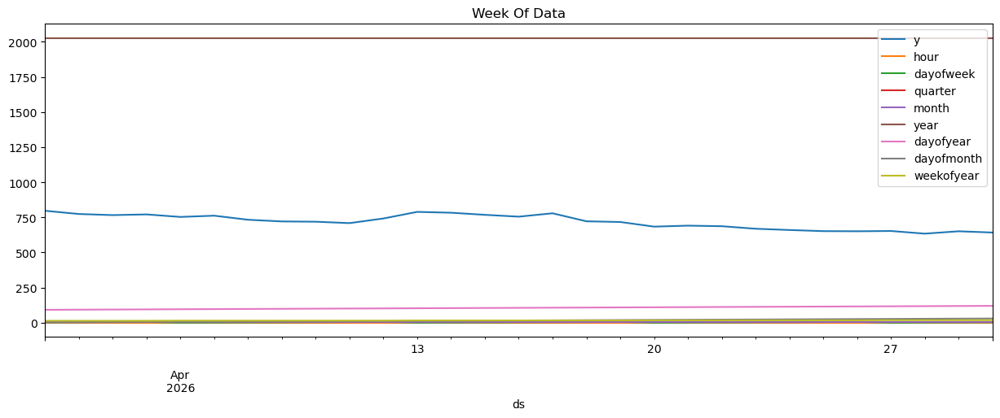

In [54]:
# Select a week of data to visualize
mask_selected_week = (xgb_data_df.index > '2026-04-01') & (xgb_data_df.index < '2026-05-01')
data_week_df = xgb_data_df.loc[mask_selected_week]

# Visualize a week of data using matplotlib and seaborn
data_week_df.plot(figsize=(15, 5), title='Week Of Data')
# plt.show()

In [55]:
# Visualize a week of data using plotly
fig = px.line(data_week_df, x=data_week_df.index, y='y', title='Week Of Data')
fig.update_traces(line_color='blue', name='Water Height', showlegend=True)
fig.update_layout(title='Week Of Data', title_x=0.5, xaxis_title='Date', yaxis_title='Water Height')
fig.show()

In [56]:
xgb_data_df.columns

Index(['y', 'hour', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear',
       'dayofmonth', 'weekofyear'],
      dtype='object')

In [57]:
# check zeros values
zero_values_count = (xgb_data_df == 0).sum()
print("Nombre de valeurs égales à zéro par colonne :")
print(zero_values_count['hour'])

Nombre de valeurs égales à zéro par colonne :
7098


In [ ]:
RANDOM_SEED = 42
# target name for Regression
TARGET_NAME = 'y'  # "water_height"
print("Target :", TARGET_NAME)

# new features names for Regression
feature_names = xgb_data_df.columns.tolist()
feature_names.remove(TARGET_NAME)
# # get unique features from feature_names
# feature_names = list(set(feature_names))

# remove empty columns from features
for col in ["hour",]:
    if col in feature_names:
        feature_names.remove(col)
print("Features utilisées :", feature_names)

Target : y
Features utilisées : ['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear']


In [ ]:
# split train/test
X = xgb_data_df[feature_names]  # features: water height and flow rate
y = xgb_data_df[TARGET_NAME]          # target: water height

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [60]:
# run xgboost regressor model on this station data
from xgboost import XGBRegressor

# xgb_regressor_model = XGBRegressor(n_estimators=100,
#                                    eval_metric="rmse",
#                      max_depth=3,
#                      n_jobs=4,
#             )
# xgb_regressor_model.fit(X_train, y_train)

# Create booster instance of ML Model using XGBoost
xgb_regressor_class = XGBRegressor(base_score=0.5,  # default base score = 0.5, global bias
                       booster='gbtree',    # default booster = gbtree, tree-based models are usually better for tabular data    
                       n_estimators=1000,   # number of trees to fit, large number for early stopping to work
                       early_stopping_rounds=50,    # stop if no improvement after 50 rounds of training
                       objective='reg:linear',  # regression task: predict a continuous value -> this is the default for XGBRegressor, so we could have omitted it
                       max_depth=3, # maximum depth of each tree, controls model complexity and overfitting
                       learning_rate=0.01,  # step size shrinkage used to prevent overfitting, smaller values lead to more robust models but require more trees (n_estimators)
                       n_jobs=2,  # use CPU cores. Note: set -1 for all CPU cores for training
                       eval_metric='rmse',  # evaluation metric to use for early stopping, root mean squared error in this case
                       eval_names=['train', 'test'],  # display names for the eval sets in the training logs
                       random_state=RANDOM_SEED  # set random seed for reproducibility
                    )

# Fit gradient boosting model: fit the model with early stopping
xgb_regressor_model = xgb_regressor_class.fit(X=X_train,  # Input feature matrix: it's training data features X_train (fit the model to the training data)
                                    y=y_train,   # Labels/Target values: it's training data labels y_train (fit the model to the training data)
        eval_set=[(X_train, y_train), (X_test, y_test)],    # A list of (X, y) tuple pairs to use as validation sets, for which metrics will be computed: this will evaluate performance on both training and test sets during training
        verbose=100,    # print evaluation results every 100 trees:  If verbose is True and an evaluation set is used, the evaluation metric measured on the validation set is printed to stdout at each boosting stage. If verbose is an integer, the evaluation metric is printed at each verbose boosting stage. The last boosting stage / the boosting stage found by using early_stopping_rounds is also printed.
    )

# display scores: accuracy
accuracy = xgb_regressor_model.score(X_test, y_test)
print(f"\nAccuracy: {accuracy}")

[0]	validation_0-rmse:997.32643	validation_1-rmse:1015.85242
[100]	validation_0-rmse:473.19636	validation_1-rmse:486.64356
[200]	validation_0-rmse:339.12909	validation_1-rmse:352.30472


c:\Users\zef\.conda\envs\mlflow-train\lib\site-packages\xgboost\callback.py:385: UserWarning: [09:17:52] WARNING: D:\bld\xgboost-split_1779358081322\work\src\objective\regression_obj.cu:277: reg:linear is now deprecated in favor of reg:squarederror.
  self.starting_round = model.num_boosted_rounds()
c:\Users\zef\.conda\envs\mlflow-train\lib\site-packages\xgboost\callback.py:385: UserWarning: [09:17:52] WARNING: D:\bld\xgboost-split_1779358081322\work\src\learner.cc:782: 
Parameters: { "eval_names" } are not used.

  self.starting_round = model.num_boosted_rounds()


[300]	validation_0-rmse:309.11705	validation_1-rmse:323.26987
[400]	validation_0-rmse:295.33944	validation_1-rmse:309.73690
[500]	validation_0-rmse:287.32470	validation_1-rmse:302.41481
[600]	validation_0-rmse:281.12586	validation_1-rmse:297.09371
[700]	validation_0-rmse:276.92490	validation_1-rmse:293.05256
[800]	validation_0-rmse:273.65205	validation_1-rmse:290.54670
[900]	validation_0-rmse:270.19436	validation_1-rmse:287.69563
[999]	validation_0-rmse:267.41956	validation_1-rmse:285.10334

Accuracy: 0.5260966160787242


In [61]:
# get predictions from the fitted model
y_test_pred = xgb_regressor_model.predict(X_test)

# display scores: r^2, RMSE, MAE
r2 = xgb_regressor_model.score(X_test, y_test)
mse = mean_squared_error(y_test, y_test_pred)
rmse = root_mean_squared_error(y_test, y_test_pred)
mae = mean_absolute_error(y_test, y_test_pred)
mape = mean_absolute_percentage_error(y_test, y_test_pred)

print("R^2 score:", r2)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("MAPE:", mape)

R^2 score: 0.5260966160787242
MSE: 81283.91540709136
RMSE: 285.1033416273674
MAE: 200.74271820498186
MAPE: 0.20394457092021792


In [62]:
# Display the predictions vs true values using plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode='markers', name='True Values'))
fig.add_trace(go.Scatter(x=y_test.index, y=y_test_pred, mode='markers', name='Predicted Values'))
fig.update_layout(title=f'{site_name} : True vs Predicted Values for {TARGET_NAME} (HIXnJ) - XGBoost Regressor',
                  title_x=0.5,
                  xaxis_title='Date',
                  yaxis_title=TARGET_NAME,
                  width=1400, height=600
                )
fig.show()

# <a id='toc4_'></a>[D) Hyperparameter Tuning & Optimization](#toc0_)


**hyperparameter tuning experiments**

**source**: https://facebook.github.io/prophet/docs/diagnostics.html#hyperparameter-tuning

Cross-validation can be used for tuning hyperparameters of the model, such as changepoint_prior_scale and seasonality_prior_scale. A Python example is given below, with a 4x4 grid of those two parameters, with parallelization over cutoffs. Here parameters are evaluated on RMSE averaged over a 30-day horizon, but different performance metrics may be appropriate for different problems.


The **performance_metrics** utility can be used to compute some useful statistics of the prediction performance (yhat, yhat_lower, and yhat_upper compared to y), as a function of the distance from the cutoff (how far into the future the prediction was). The statistics computed are:
- mean squared error (MSE), 
- root mean squared error (RMSE), 
- mean absolute error (MAE), 
- mean absolute percent error (MAPE), 
- median absolute percent error (MDAPE)
- and coverage (COVERAGE) of the yhat_lower and yhat_upper estimates. 

These are computed on a rolling window of the predictions in df_cv after sorting by horizon (ds minus cutoff). By default 10% of the predictions will be included in each window, but this can be changed with the rolling_window argument.

## <a id='toc4_1_'></a>[Data preparation for hyperparameter tuning of Prophet models](#toc0_)

In [123]:
# Method 2:  Proper Data Splitting
# CRITICAL: Use chronological split, NOT random split!
train_size = int(len(clean_data_df) * TRAIN_SIZE_RATIO)

train_df = clean_data_df[:train_size]
test_df = clean_data_df[train_size:]

print(f"Train: {len(train_df)}, Test: {len(test_df)}")

Train: 5678, Test: 1420


**Features Engineering:**

In [136]:
def create_features(df, label=None):
    """
    Create time series features based on time series index.
    -> Create this collection of new variables :
        - date equal to the index
        - hour equal to the hour of the day
        - dayofweek
        - quarter
        - month
        - year
        - dayofyear
        - dayofmonth
        - weekofyear
    -> Create an object X containing the above variables and y containing the time series

    Arguments:
        df: pandas dataframe with datetime index
    Returns:
        df: pandas dataframe with new features added
    """
    df = df.copy()
    
    df['date'] = df.index
    # df['hour'] = df['date'].hour  # add hour of the day as a feature: 0-23 
    # df['dayofweek'] = df['date'].dayofweek  # add day of the week as a feature: 0-6
    # df['quarter'] = df['date'].quarter  # add quarter of the year as a feature: 1-4
    # df['month'] = df['date'].month  # add month as a feature: 1-12
    # df['year'] = df['date'].year  # add year as a feature
    # df['dayofyear'] = df['date'].dayofyear  # add day of the year as a feature: 1-365
    # df['dayofmonth'] = df['date'].day  # add day of the month as a feature: 1-31
    # df['weekofyear'] = df['date'].isocalendar().week  # add week of the year as a feature: 1-52
    
    # df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week

    # X = df[['hour','dayofweek','quarter','month','year',
    #        'dayofyear','dayofmonth','weekofyear']]
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X



# reset index of the clean_data_df to ensure the datetime column is properly set for feature creation
hpt_data_df = clean_data_df.copy()
# xgb_data_df = xgb_data_df.reset_index(drop=True)#.rename(columns={DATETIME_COLUMN_NAME:"ds", PROPHET_TARGET_VARIABLE:"y"})

# set the datetime column as the index of the dataframe
# xgb_data_df[PROPHET_DATETIME_COLUMN] = pd.to_datetime(xgb_data_df[DATETIME_COLUMN_NAME])
hpt_data_df = hpt_data_df.set_index(PROPHET_DATETIME_COLUMN)
# display(hpt_data_df)

# Create features for the entire dataset
X, y = create_features(hpt_data_df, label=PROPHET_TARGET_VARIABLE)
display(hpt_data_df)

Xy_data_df = pd.concat([X, y], axis=1)
display(Xy_data_df)

,y
ds,
2007-01-01,1207.0
2007-01-02,1554.0
2007-01-03,1675.0
2007-01-04,1677.0
2007-01-05,1590.0
...,...
2026-06-03,626.0
2026-06-04,614.0
2026-06-05,601.0


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,y
ds,,,,,,,,
2007-01-01,0,1,1,2007,1,1,1,1207.0
2007-01-02,1,1,1,2007,2,2,1,1554.0
2007-01-03,2,1,1,2007,3,3,1,1675.0
2007-01-04,3,1,1,2007,4,4,1,1677.0
2007-01-05,4,1,1,2007,5,5,1,1590.0
...,...,...,...,...,...,...,...,...
2026-06-03,2,2,6,2026,154,3,23,626.0
2026-06-04,3,2,6,2026,155,4,23,614.0
2026-06-05,4,2,6,2026,156,5,23,601.0


In [137]:
hpt_feature_names = Xy_data_df.drop(columns=[PROPHET_TARGET_VARIABLE]).columns.tolist()
print("Feature names:", hpt_feature_names)

hpt_target_name = PROPHET_TARGET_VARIABLE
print("Target name:", hpt_target_name)

Feature names: ['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear']
Target name: y


## <a id='toc4_2_'></a>[Hyperparameters and estimator class that wraps around Prophet models](#toc0_)

In [141]:
# using scikit-learn for hyperparameter tuning of Prophet models

import numpy as np
import pandas as pd
from prophet import Prophet
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import mean_absolute_percentage_error


# We create a custom estimator class that wraps around Prophet and implements the fit, predict, and score methods required by scikit-learn.
class ProphetEstimator(BaseEstimator, RegressorMixin):
    """Scikit-learn compatible wrapper around Prophet."""

    def __init__(
        self,
        changepoint_prior_scale=0.05,
        seasonality_prior_scale=10.0,
        holidays_prior_scale=10.0,
        seasonality_mode="additive",
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False, # We set daily seasonality to False because our data is daily and we don't expect a strong daily pattern, but you can experiment with this as well.
        # hourly_seasonality=False, # We set hourly seasonality to False because our data is daily and we don't expect a strong hourly pattern, but you can experiment with this as well.
    ):
        self.changepoint_prior_scale = changepoint_prior_scale
        self.seasonality_prior_scale = seasonality_prior_scale
        self.holidays_prior_scale = holidays_prior_scale
        self.seasonality_mode = seasonality_mode
        self.yearly_seasonality = yearly_seasonality
        self.weekly_seasonality = weekly_seasonality
        self.daily_seasonality = daily_seasonality
        # self.hourly_seasonality = hourly_seasonality

    def fit(self, X, y):
        X_df = pd.DataFrame(X).copy()
        if "ds" not in X_df.columns:
            X_df.columns = ["ds"]
        train_df = X_df.copy()
        train_df["y"] = np.asarray(y)

        self.model_ = Prophet(
            changepoint_prior_scale=self.changepoint_prior_scale,
            seasonality_prior_scale=self.seasonality_prior_scale,
            holidays_prior_scale=self.holidays_prior_scale,
            seasonality_mode=self.seasonality_mode,
            yearly_seasonality=self.yearly_seasonality,
            weekly_seasonality=self.weekly_seasonality,
            daily_seasonality=self.daily_seasonality,
            # hourly_seasonality=self.hourly_seasonality,
        )
        self.model_.fit(train_df)
        return self

    def predict(self, X):
        X_df = pd.DataFrame(X).copy()
        if "ds" not in X_df.columns:
            X_df.columns = ["ds"]
        forecast = self.model_.predict(X_df)
        return forecast["yhat"].to_numpy()

    def score(self, X, y):
        y_pred = self.predict(X)
        # GridSearchCV/RandomizedSearchCV maximizes score, so use negative MAPE (smaller MAPE is better)
        return -mean_absolute_percentage_error(y, y_pred)



# Build training matrices from your already-loaded Prophet dataframe (must include ds, y)
# X = Xy_data_df[hpt_feature_names].copy()  
X = clean_data_df[["ds",]].copy()  # features: just the date column for Prophet but can be extended with additional features if needed such as holidays, regressors, year, month, day, etc.
y = clean_data_df[hpt_target_name].copy()      # target: water height

hyper_params = {
    "changepoint_prior_scale": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5], #[0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.5]
    "seasonality_prior_scale": [0.01, 1.0, 5.0, 10.0], #[0.01, 1.0, 2.0, 5.0, 8.0, 10.0]
    "holidays_prior_scale": [1.0, 5.0, 10.0], #[1.0, 2.0, 5.0, 8.0, 10.0]
    "seasonality_mode": ["additive", "multiplicative"],
}

# We use TimeSeriesSplit for cross-validation to ensure that the temporal order of the data is respected during 
# training and validation, which is crucial for time series forecasting tasks.
NUM_SPLITS = 4+1*0
tscv = TimeSeriesSplit(n_splits=NUM_SPLITS)

In [142]:
X

,ds
0,2007-01-01
1,2007-01-02
2,2007-01-03
3,2007-01-04
4,2007-01-05
...,...
7093,2026-06-03
7094,2026-06-04
7095,2026-06-05
7096,2026-06-06


In [143]:
y

0       1207.0
1       1554.0
2       1675.0
3       1677.0
4       1590.0
         ...  
7093     626.0
7094     614.0
7095     601.0
7096     592.0
7097     581.0
Name: y, Length: 7098, dtype: float64

## <a id='toc4_3_'></a>[GridSearchCV of scikit-learn with Prophet estimator](#toc0_)

In [144]:
grid_search = GridSearchCV(
    estimator=ProphetEstimator(),
    param_grid=hyper_params,
    cv=tscv,
    scoring="neg_mean_absolute_percentage_error",
    n_jobs=4,
    verbose=1,
    # random_state=42, # GridSearchCV does not have a random_state parameter, but RandomizedSearchCV does. If you switch to RandomizedSearchCV, you can set random_state for reproducibility.
)

grid_search.fit(X, y)

best_mape = -grid_search.best_score_
print("Best Params:", grid_search.best_params_)
print(f"Best CV MAPE: {best_mape:.6f}")

# After finding the best hyperparameters, we can access the best Prophet model from the grid search results. 
# The best_estimator_ attribute of the grid search object contains the estimator with the best found parameters, 
# and we can access the underlying Prophet model using the model_ attribute of our custom ProphetEstimator wrapper.
best_prophet_model_grid = grid_search.best_estimator_.model_

Fitting 4 folds for each of 144 candidates, totalling 576 fits


14:09:21 - cmdstanpy - INFO - Chain [1] start processing
14:09:21 - cmdstanpy - INFO - Chain [1] done processing


Best Params: {'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 1.0, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}
Best CV MAPE: 0.264857


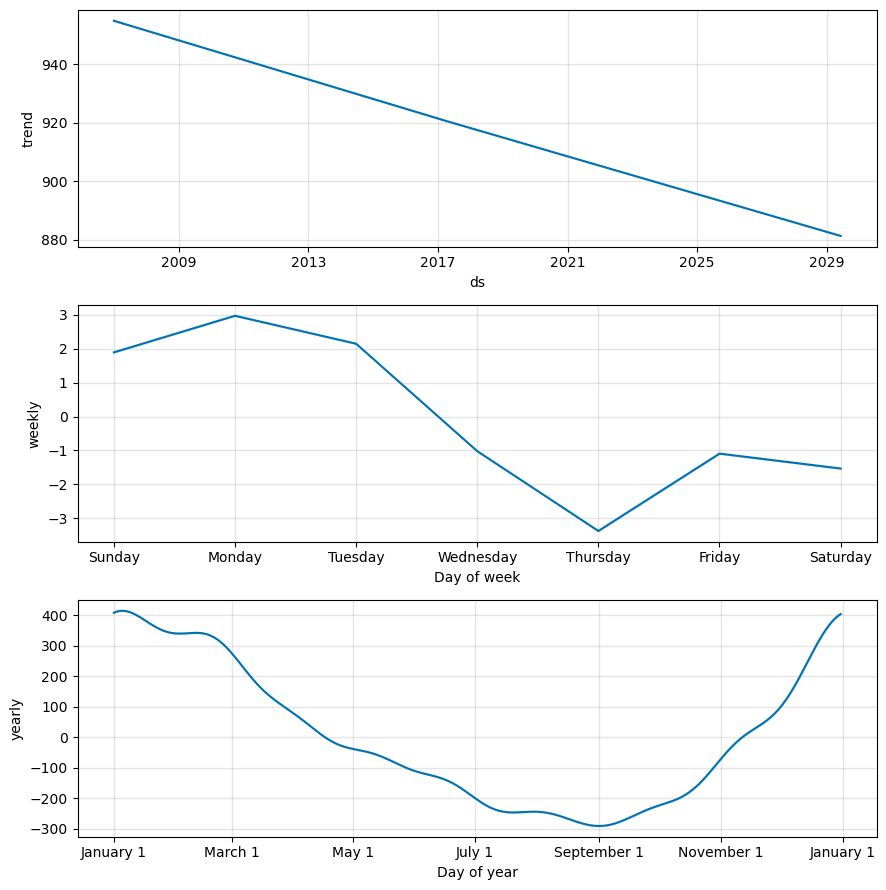

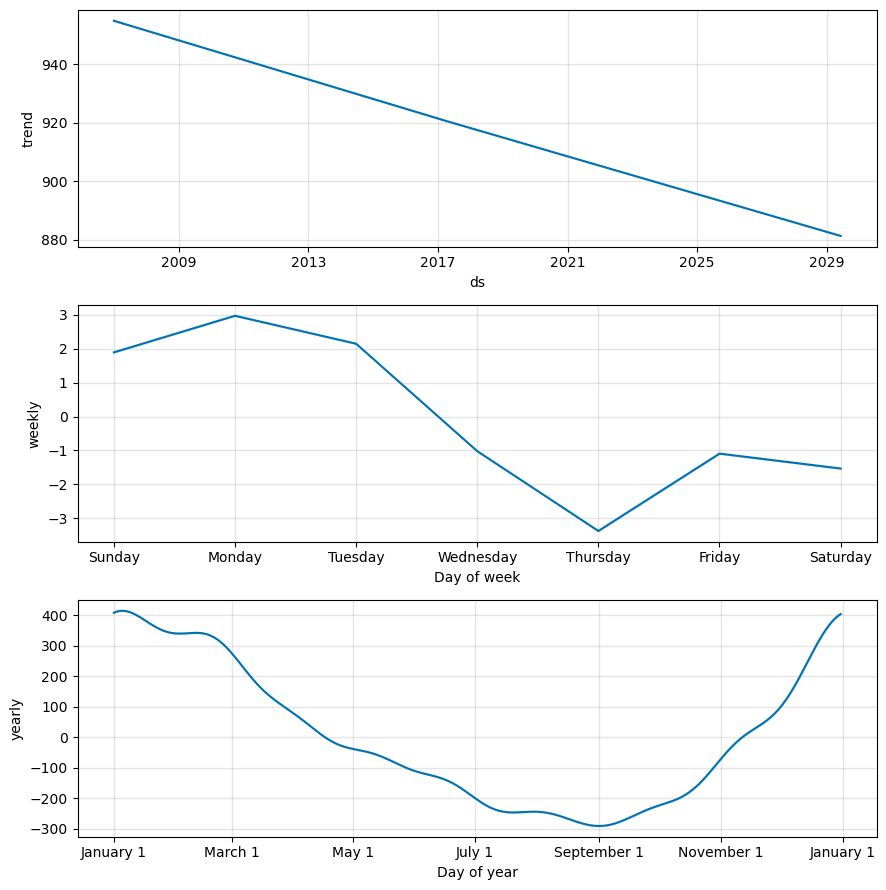

In [72]:
# Generate forecast using the best Prophet model from the grid search
future_grid = best_prophet_model_grid.make_future_dataframe(periods=365 * NUM_YEARS_TO_PREDICT)
forecast_grid = best_prophet_model_grid.predict(future_grid)

best_prophet_model_grid.plot_components(forecast_grid)

In [75]:
# =============================================== fig 7 bis

# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp['ds'], y=train_fbp['y'], mode='lines+markers', name='Actual (Training)', line=dict(color='blue')))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp['ds'], y=test_fbp['y'], mode='lines+markers', name='Actual (Test)', line=dict(color='green')))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat'], mode='lines', name='Forecast', line=dict(color='red')))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat_upper'], fill=None, mode='lines', 
                        line_color='rgba(0,0,0,0)', showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat_lower'], fill='tonexty', mode='lines', 
                        line_color='rgba(0,0,0,0)', name='Confidence Interval', 
                        fillcolor='rgba(255,0,0,0.2)'))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="red", annotation_text=f"Flood Threshold ({2.86*1000}) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text=f"Flood Threshold ({2.77*1000}) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="green", annotation_text=f"Flood Threshold ({2.58*1000}) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
# fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

## <a id='toc4_4_'></a>[RandomizedSearchCV of scikit-learn with Prophet estimator](#toc0_)

In [73]:
random_search = RandomizedSearchCV(
    estimator=ProphetEstimator(),
    param_distributions=hyper_params,
    n_iter=10,
    cv=tscv,
    scoring="neg_mean_absolute_percentage_error",
    n_jobs=4,
    verbose=1,
    random_state=42,
)

random_search.fit(X, y)
best_mape_random = -random_search.best_score_
print("Best Params (Randomized):", random_search.best_params_)
print(f"Best CV MAPE (Randomized): {best_mape_random:.6f}")

# After finding the best hyperparameters from the randomized search, we can access the best Prophet model in the same way as with the grid search.
best_prophet_model_random = random_search.best_estimator_.model_

Fitting 4 folds for each of 10 candidates, totalling 40 fits


09:44:38 - cmdstanpy - INFO - Chain [1] start processing
09:44:39 - cmdstanpy - INFO - Chain [1] done processing


Best Params (Randomized): {'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive', 'holidays_prior_scale': 10.0, 'changepoint_prior_scale': 0.001}
Best CV MAPE (Randomized): 0.271624


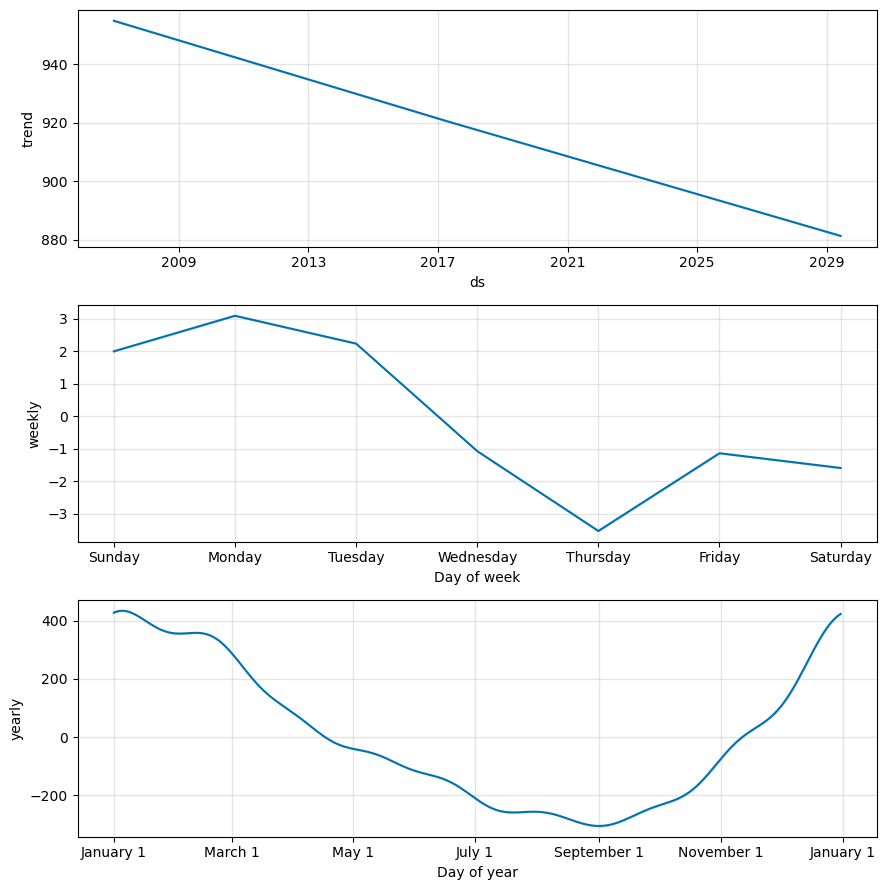

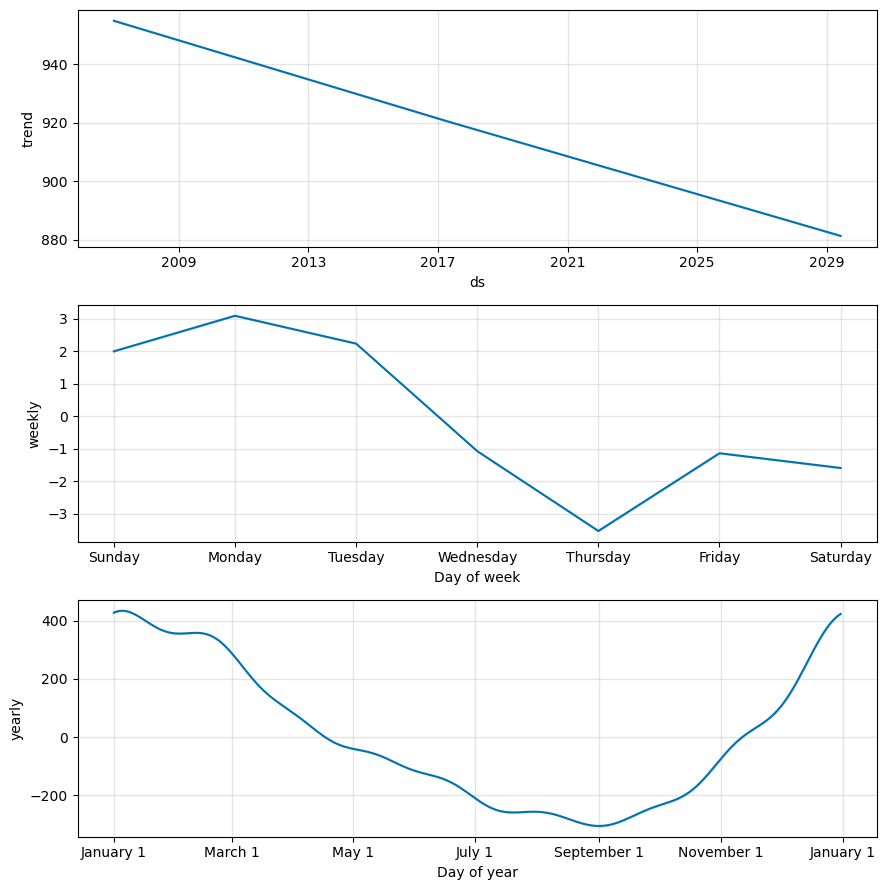

In [74]:
# Generate forecast using the best Prophet model from the grid search
future_random = best_prophet_model_grid.make_future_dataframe(periods=365 * NUM_YEARS_TO_PREDICT)
forecast_random = best_prophet_model_grid.predict(future_random)

best_prophet_model_random.plot_components(forecast_random)

In [76]:
# =============================================== fig 7 bis

# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp['ds'], y=train_fbp['y'], mode='lines+markers', name='Actual (Training)', line=dict(color='blue')))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp['ds'], y=test_fbp['y'], mode='lines+markers', name='Actual (Test)', line=dict(color='green')))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast_random['ds'], y=forecast_random['yhat'], mode='lines', name='Forecast', line=dict(color='red')))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast_random['ds'], y=forecast_random['yhat_upper'], fill=None, mode='lines', 
                        line_color='rgba(0,0,0,0)', showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast_random['ds'], y=forecast_random['yhat_lower'], fill='tonexty', mode='lines', 
                        line_color='rgba(0,0,0,0)', name='Confidence Interval', 
                        fillcolor='rgba(255,0,0,0.2)'))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="red", annotation_text=f"Flood Threshold ({2.86*1000}) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text=f"Flood Threshold ({2.77*1000}) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="green", annotation_text=f"Flood Threshold ({2.58*1000}) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
# fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()